In [1]:
import numpy as np
import pandas as pd
import os

In [2]:
!rm -rf /kaggle/working/*

In [3]:
from __future__ import print_function
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm

There are 365 Images .


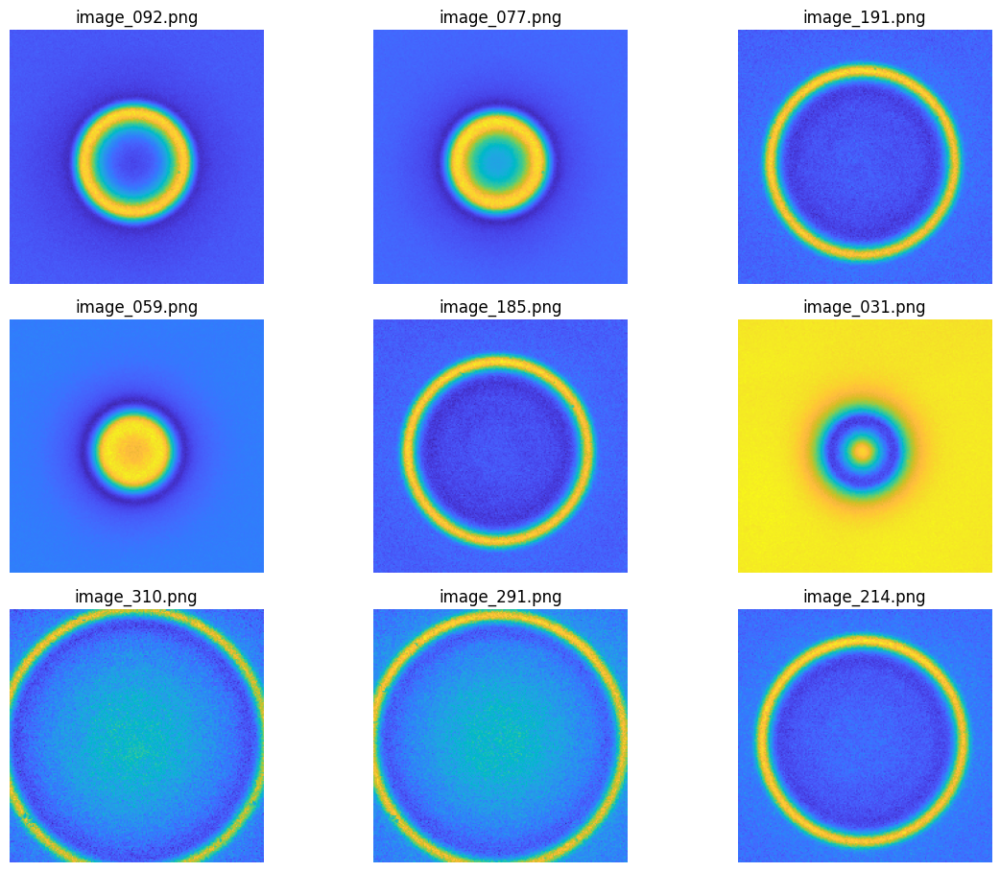

In [4]:
PATH = '/kaggle/input/healthy/Healthy/'
images = os.listdir(PATH)
print(f'There are {len(os.listdir(PATH))} Images .')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH)))
    # https://matplotlib.org/users/image_tutorial.html
    img = plt.imread(PATH + images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])


In [5]:
batch_size = 2
image_size = 64

random_transforms = [transforms.ColorJitter()]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                               ])

train_data = datasets.ImageFolder('/kaggle/input/healthy/', transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

(64, 64, 3)


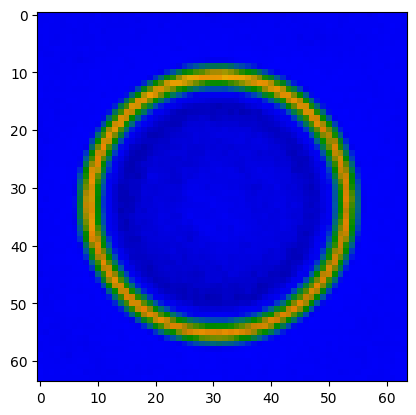

(64, 64, 3)


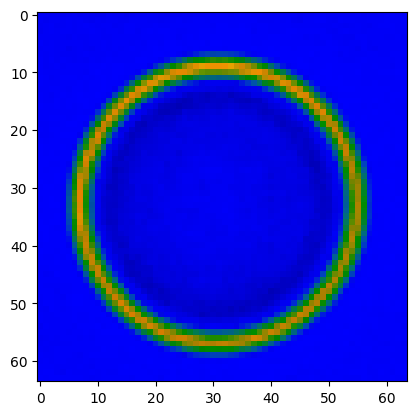

IndexError: index 2 is out of bounds for axis 0 with size 2

In [6]:
for i in range(4):
    plt.imshow(imgs[i])
    print(imgs[i].shape)
    plt.show()

In [10]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block
        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), # Fully connected layer via convolution.
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block
        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  # FC with Conv.
        )
    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

In [7]:
!mkdir results
!ls

results


In [8]:
LR_G = 0.0005
LR_D = 0.00005

beta1 = 0.5
epochs = 100

real_label = 0.9
fake_label = 0
nz = 128
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [11]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

In [12]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [13]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()

In [14]:
import torch
import numpy as np
import matplotlib.pyplot as plt

def show_generated_img_unnormalized(n_images=5, mean=0.5, std=0.5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        # Unnormalize the image
        gen_image = gen_image * std + mean  # If mean and std are lists, make sure they're numpy arrays.
        gen_image = np.clip(gen_image, 0, 1)  # Ensure values are within [0, 1] after unnormalizing
        sample.append(gen_image)

    figure, axes = plt.subplots(1, len(sample), figsize=(64, 64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        # As imshow expects [0, 1] range for float images, no need to scale to [0, 255]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()


In [21]:
def plot_final_loss(avg_G_losses, avg_D_losses):
    epochs = range(1, len(avg_G_losses) + 1)
    plt.figure(figsize=(10,4))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(epochs, avg_G_losses, label="Average G Loss")
    plt.plot(epochs, avg_D_losses, label="Average D Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

/tmp/ipykernel_120/1791354421.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):


  0%|          | 0/183 [00:00<?, ?it/s]

[1/100][91/183] Loss_D: 2.0522 Loss_G: 0.8314 D(x): 0.4755 D(G(z)): 0.7223 / 0.4220
[1/100][182/183] Loss_D: 1.3931 Loss_G: 1.0822 D(x): 0.4820 D(G(z)): 0.4782 / 0.3167


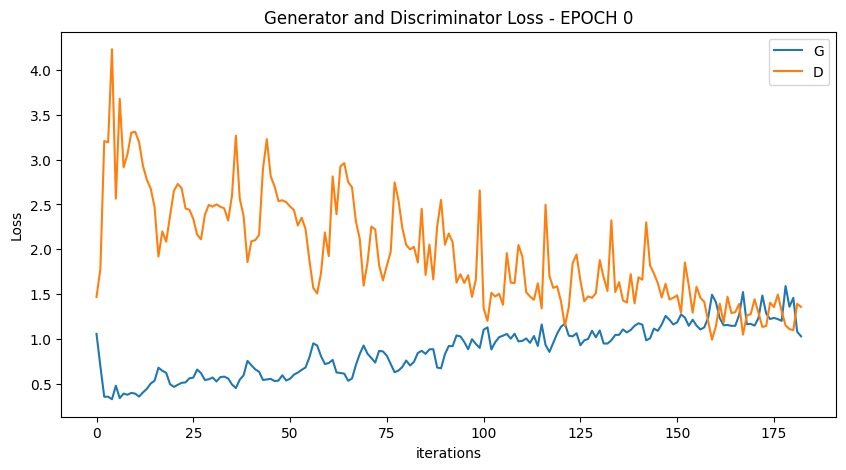

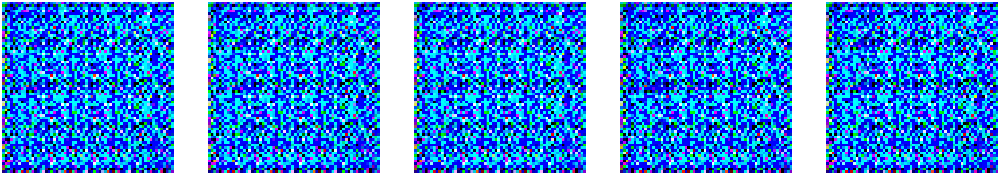

  0%|          | 0/183 [00:00<?, ?it/s]

[2/100][91/183] Loss_D: 1.3131 Loss_G: 1.7861 D(x): 0.4451 D(G(z)): 0.3256 / 0.2618
[2/100][182/183] Loss_D: 0.7032 Loss_G: 2.3377 D(x): 0.5512 D(G(z)): 0.0822 / 0.0800


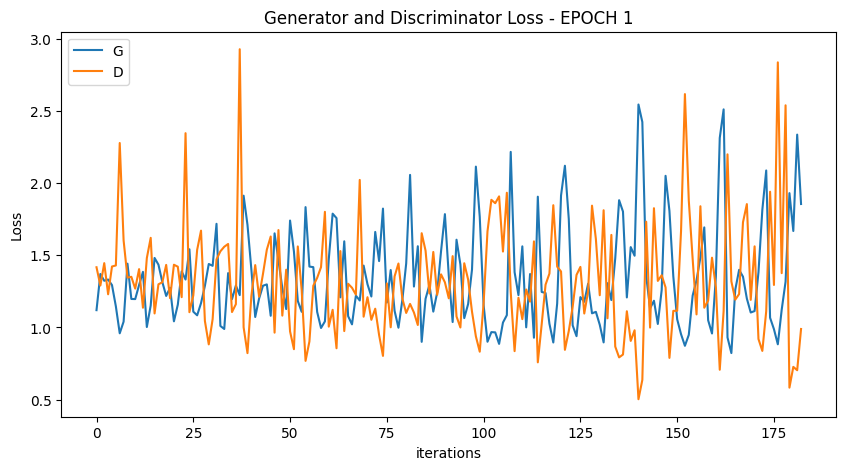

  0%|          | 0/183 [00:00<?, ?it/s]

[3/100][91/183] Loss_D: 1.1726 Loss_G: 1.1862 D(x): 0.6495 D(G(z)): 0.4898 / 0.2785
[3/100][182/183] Loss_D: 1.7864 Loss_G: 1.0945 D(x): 0.2428 D(G(z)): 0.3687 / 0.3143


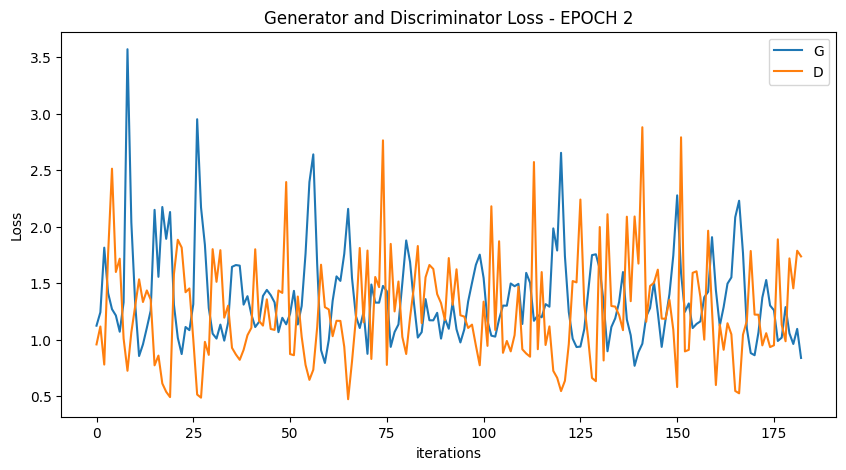

  0%|          | 0/183 [00:00<?, ?it/s]

[4/100][91/183] Loss_D: 0.5384 Loss_G: 1.9112 D(x): 0.9114 D(G(z)): 0.1914 / 0.1214
[4/100][182/183] Loss_D: 2.4169 Loss_G: 1.4788 D(x): 0.1132 D(G(z)): 0.3386 / 0.1982


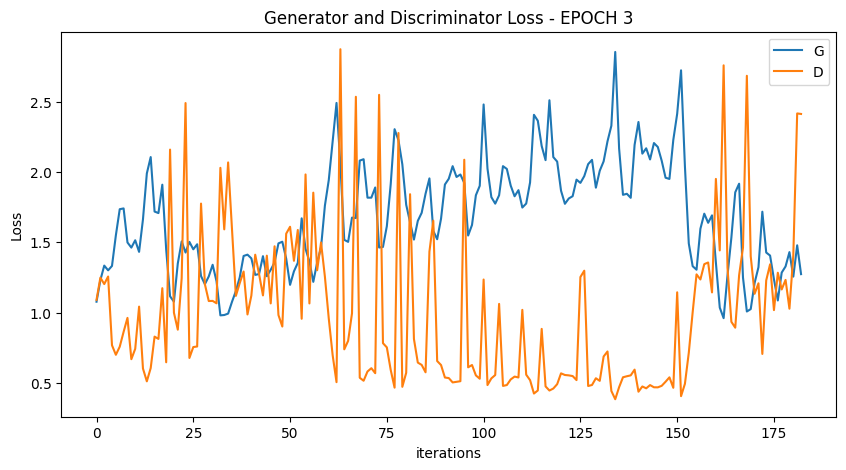

  0%|          | 0/183 [00:00<?, ?it/s]

[5/100][91/183] Loss_D: 1.9280 Loss_G: 1.9887 D(x): 0.4660 D(G(z)): 0.0804 / 0.1112
[5/100][182/183] Loss_D: 0.8450 Loss_G: 1.7603 D(x): 0.6328 D(G(z)): 0.1979 / 0.1441


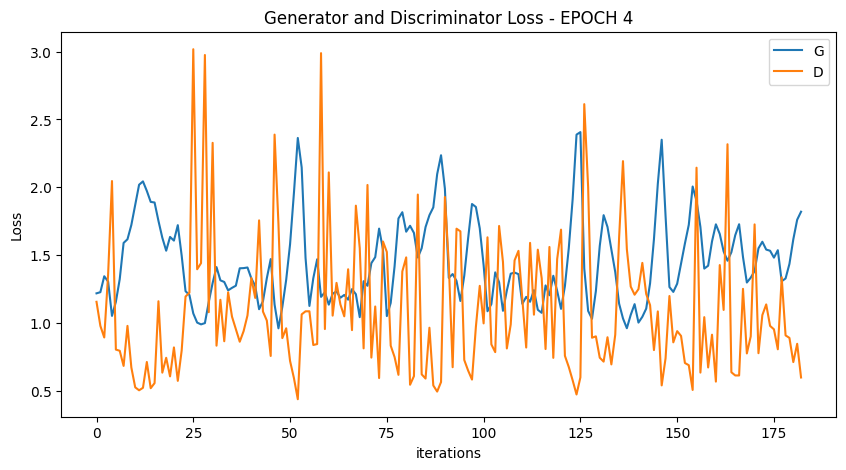

  0%|          | 0/183 [00:00<?, ?it/s]

[6/100][91/183] Loss_D: 1.3554 Loss_G: 2.8444 D(x): 0.3398 D(G(z)): 0.0266 / 0.0427
[6/100][182/183] Loss_D: 1.0257 Loss_G: 1.3923 D(x): 0.4823 D(G(z)): 0.2614 / 0.2188


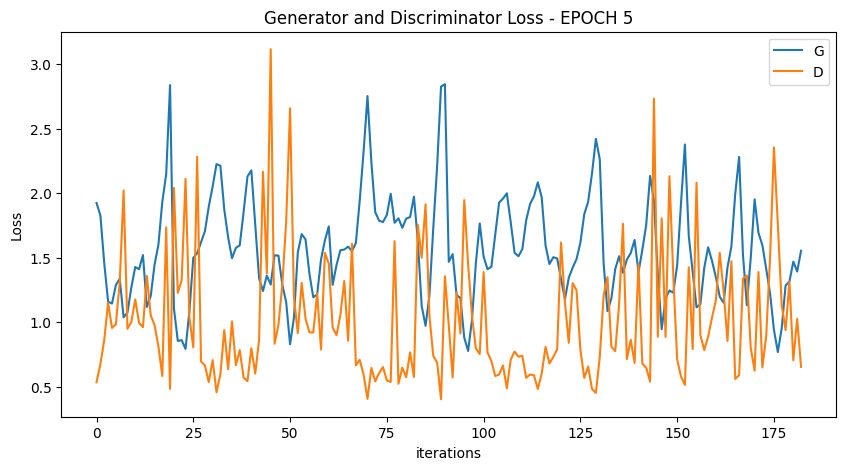

  0%|          | 0/183 [00:00<?, ?it/s]

[7/100][91/183] Loss_D: 0.5951 Loss_G: 1.8463 D(x): 0.9296 D(G(z)): 0.2295 / 0.1318
[7/100][182/183] Loss_D: 1.4733 Loss_G: 1.5433 D(x): 0.3256 D(G(z)): 0.1627 / 0.1841


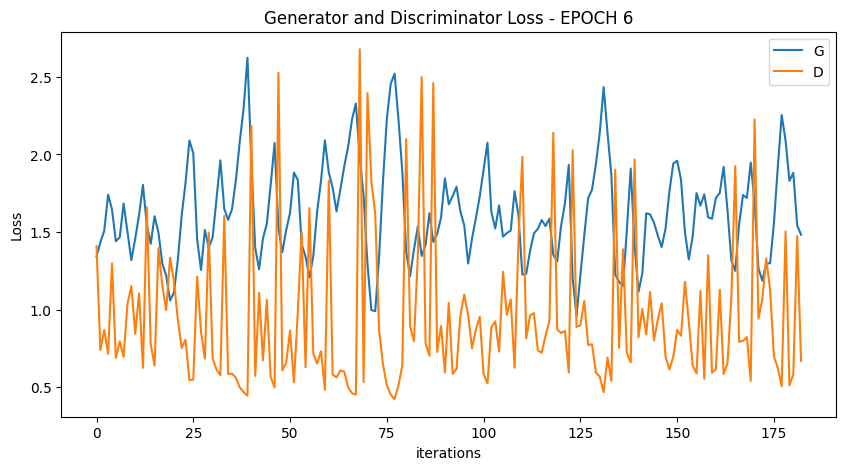

  0%|          | 0/183 [00:00<?, ?it/s]

[8/100][91/183] Loss_D: 1.5989 Loss_G: 1.1972 D(x): 0.4080 D(G(z)): 0.3699 / 0.2741
[8/100][182/183] Loss_D: 0.6505 Loss_G: 1.9436 D(x): 0.7298 D(G(z)): 0.2075 / 0.1180


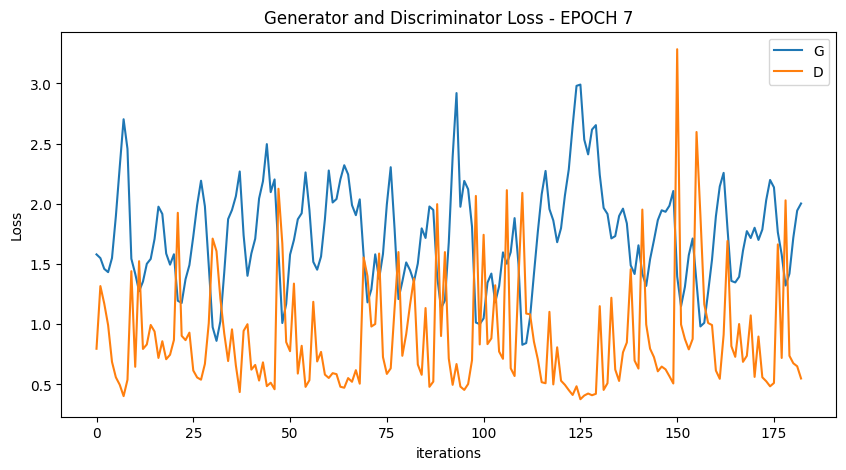

  0%|          | 0/183 [00:00<?, ?it/s]

[9/100][91/183] Loss_D: 0.6015 Loss_G: 1.7217 D(x): 0.8479 D(G(z)): 0.2312 / 0.1504
[9/100][182/183] Loss_D: 0.9062 Loss_G: 2.1471 D(x): 0.4757 D(G(z)): 0.0994 / 0.0931


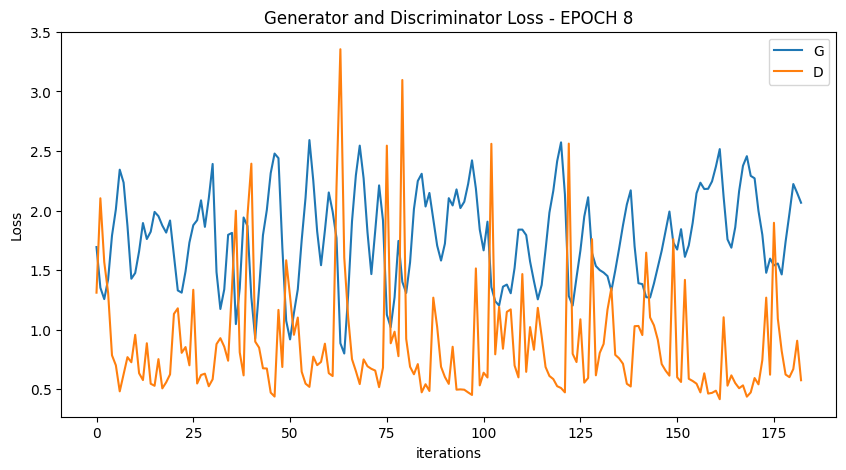

  0%|          | 0/183 [00:00<?, ?it/s]

[10/100][91/183] Loss_D: 2.3108 Loss_G: 1.5262 D(x): 0.2374 D(G(z)): 0.1890 / 0.1877
[10/100][182/183] Loss_D: 1.0416 Loss_G: 1.3990 D(x): 0.5679 D(G(z)): 0.2908 / 0.2176


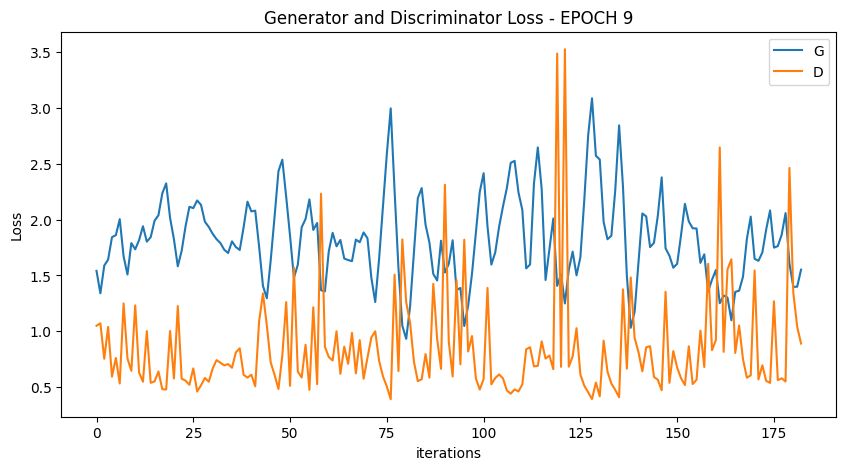

  0%|          | 0/183 [00:00<?, ?it/s]

[11/100][91/183] Loss_D: 0.5173 Loss_G: 2.1470 D(x): 0.9362 D(G(z)): 0.1479 / 0.0930
[11/100][182/183] Loss_D: 0.7768 Loss_G: 2.0766 D(x): 0.5711 D(G(z)): 0.1575 / 0.1007


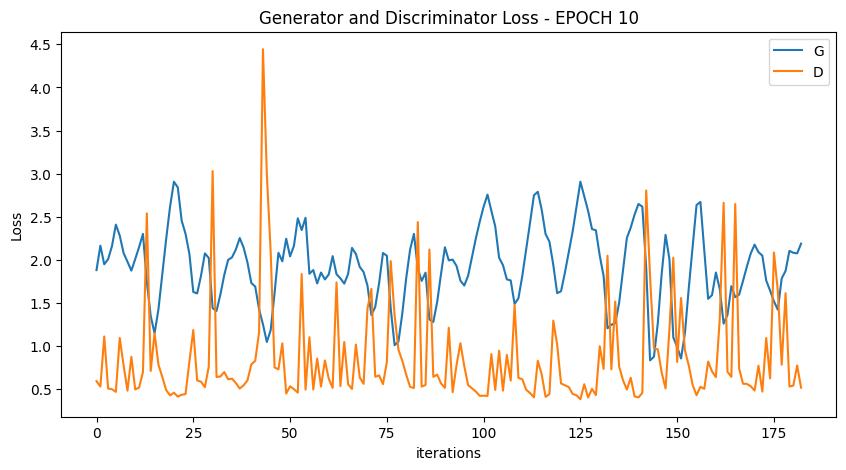

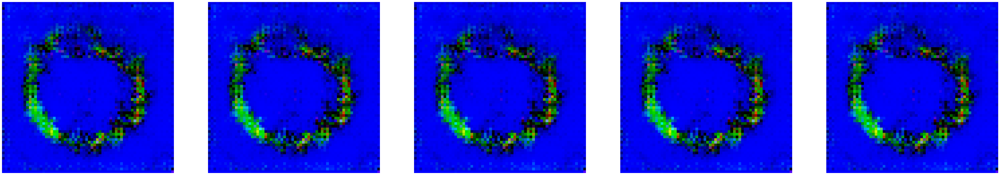

  0%|          | 0/183 [00:00<?, ?it/s]

[12/100][91/183] Loss_D: 2.7597 Loss_G: 1.2099 D(x): 0.0565 D(G(z)): 0.1542 / 0.2701
[12/100][182/183] Loss_D: 0.5357 Loss_G: 2.1094 D(x): 0.7431 D(G(z)): 0.1241 / 0.0971


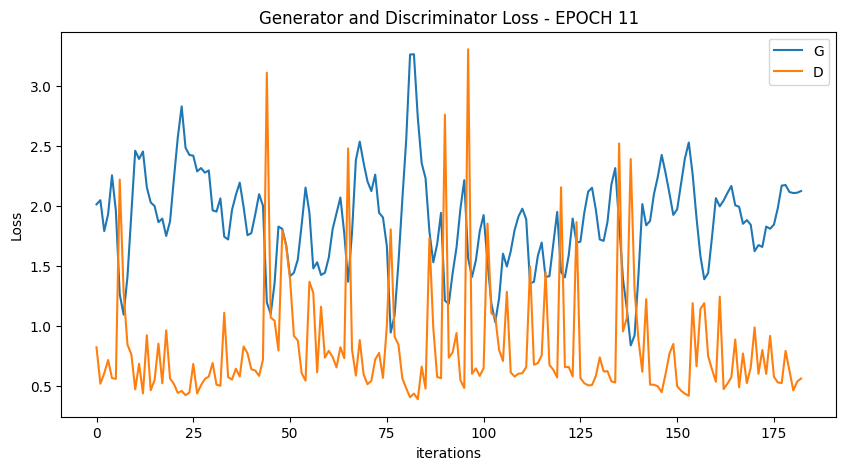

  0%|          | 0/183 [00:00<?, ?it/s]

[13/100][91/183] Loss_D: 0.8374 Loss_G: 2.0395 D(x): 0.4976 D(G(z)): 0.0876 / 0.1051
[13/100][182/183] Loss_D: 1.3457 Loss_G: 2.2100 D(x): 0.2573 D(G(z)): 0.0600 / 0.0867


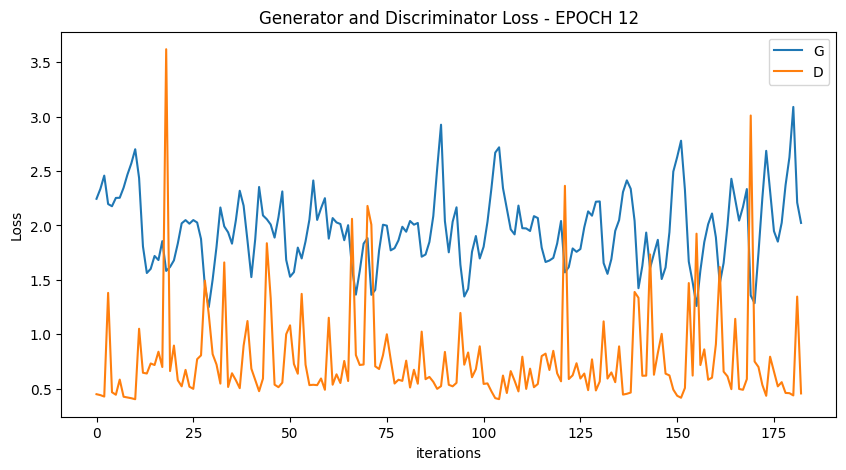

  0%|          | 0/183 [00:00<?, ?it/s]

[14/100][91/183] Loss_D: 0.5322 Loss_G: 2.2442 D(x): 0.9163 D(G(z)): 0.1849 / 0.0835
[14/100][182/183] Loss_D: 0.4890 Loss_G: 2.2685 D(x): 0.9243 D(G(z)): 0.1478 / 0.0812


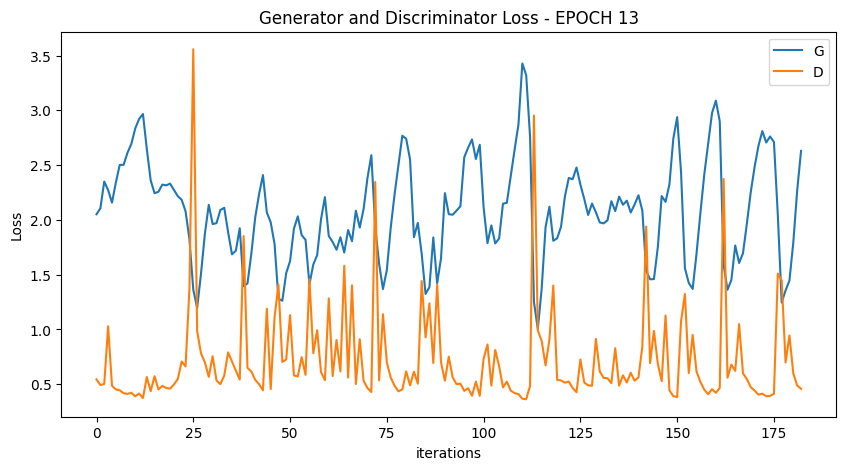

  0%|          | 0/183 [00:00<?, ?it/s]

[15/100][91/183] Loss_D: 0.3855 Loss_G: 2.8318 D(x): 0.9116 D(G(z)): 0.0561 / 0.0432
[15/100][182/183] Loss_D: 0.7515 Loss_G: 2.2192 D(x): 0.5292 D(G(z)): 0.0837 / 0.0858


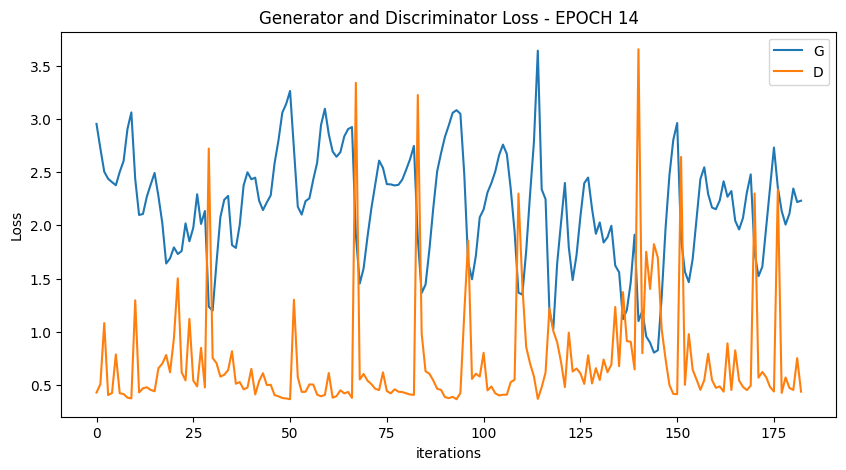

  0%|          | 0/183 [00:00<?, ?it/s]

[16/100][91/183] Loss_D: 0.4438 Loss_G: 2.4785 D(x): 0.8214 D(G(z)): 0.0891 / 0.0642
[16/100][182/183] Loss_D: 0.9736 Loss_G: 1.6012 D(x): 0.5899 D(G(z)): 0.1451 / 0.1743


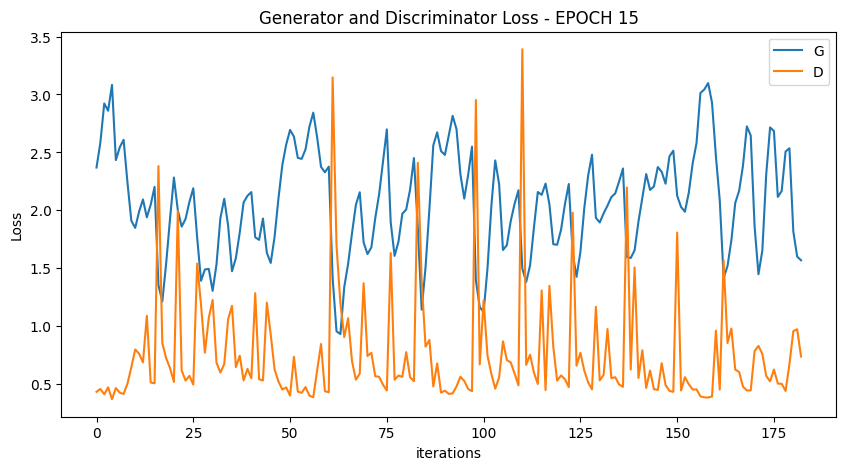

  0%|          | 0/183 [00:00<?, ?it/s]

[17/100][91/183] Loss_D: 0.5988 Loss_G: 1.5623 D(x): 0.9128 D(G(z)): 0.2383 / 0.1804
[17/100][182/183] Loss_D: 0.3887 Loss_G: 2.8954 D(x): 0.8632 D(G(z)): 0.0517 / 0.0403


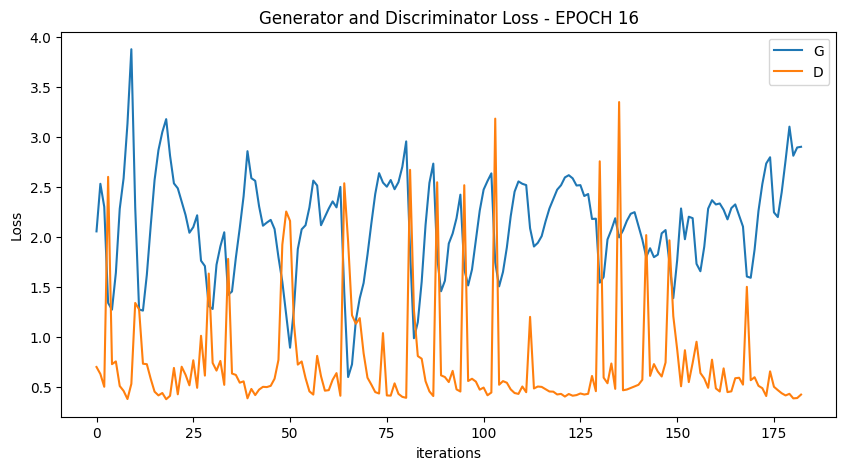

  0%|          | 0/183 [00:00<?, ?it/s]

[18/100][91/183] Loss_D: 0.4654 Loss_G: 2.3084 D(x): 0.9419 D(G(z)): 0.0997 / 0.0777
[18/100][182/183] Loss_D: 0.3979 Loss_G: 2.9811 D(x): 0.9470 D(G(z)): 0.0516 / 0.0370


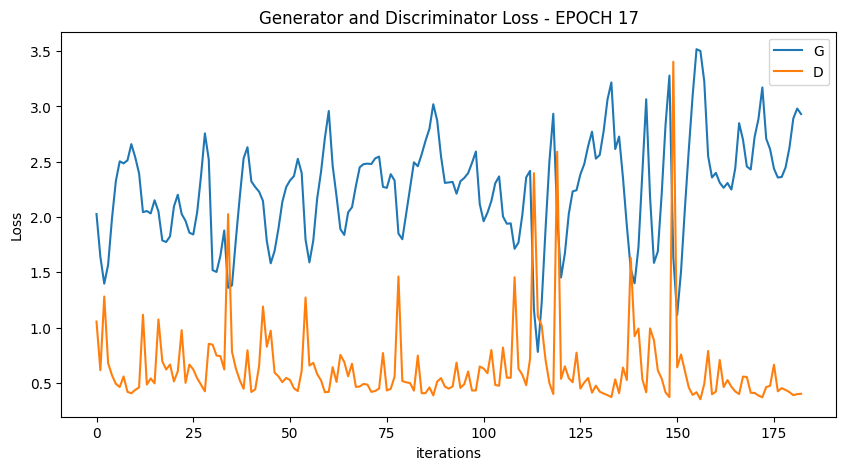

  0%|          | 0/183 [00:00<?, ?it/s]

[19/100][91/183] Loss_D: 0.4405 Loss_G: 2.3463 D(x): 0.8468 D(G(z)): 0.0900 / 0.0751
[19/100][182/183] Loss_D: 0.6786 Loss_G: 2.0231 D(x): 0.8696 D(G(z)): 0.2558 / 0.1070


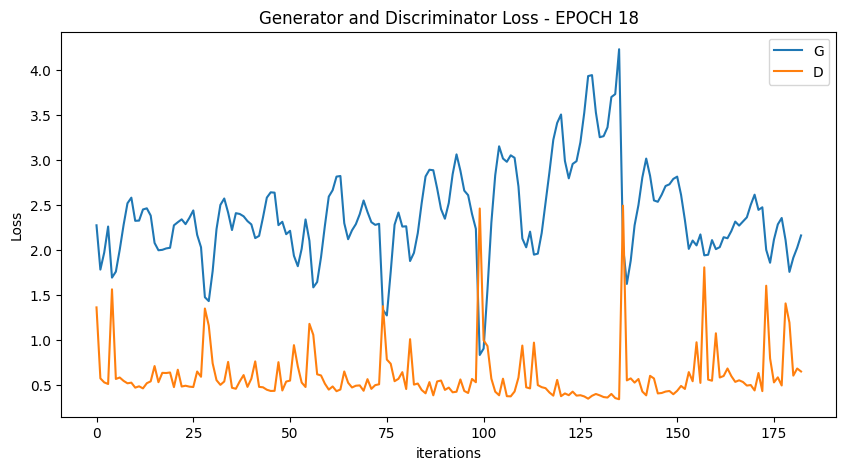

  0%|          | 0/183 [00:00<?, ?it/s]

[20/100][91/183] Loss_D: 0.6234 Loss_G: 1.6925 D(x): 0.9272 D(G(z)): 0.2490 / 0.1554
[20/100][182/183] Loss_D: 0.4288 Loss_G: 2.5593 D(x): 0.8601 D(G(z)): 0.0913 / 0.0586


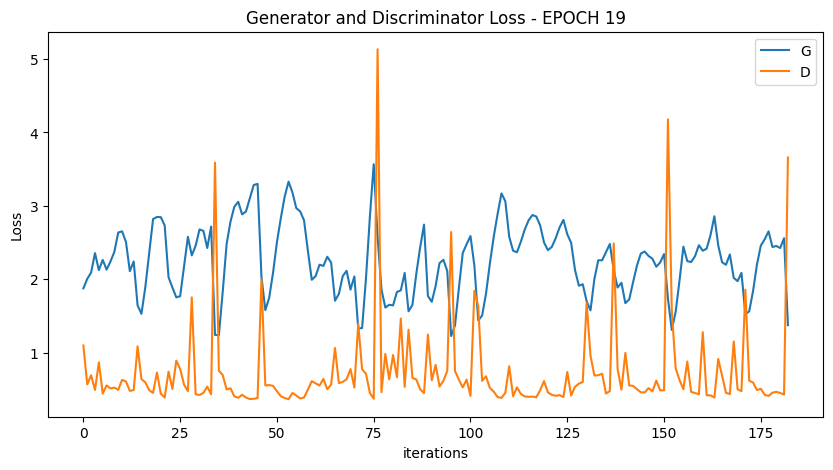

  0%|          | 0/183 [00:00<?, ?it/s]

[21/100][91/183] Loss_D: 0.5064 Loss_G: 1.8162 D(x): 0.8325 D(G(z)): 0.1402 / 0.1351
[21/100][182/183] Loss_D: 0.5991 Loss_G: 1.2758 D(x): 0.9192 D(G(z)): 0.2264 / 0.2502


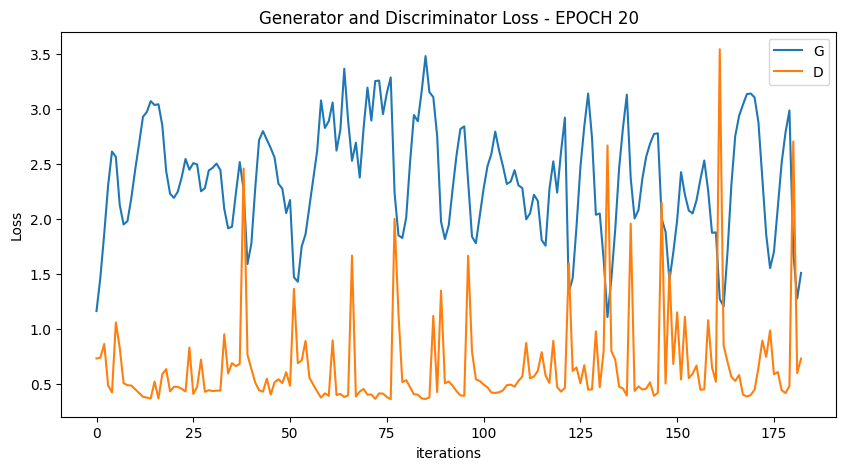

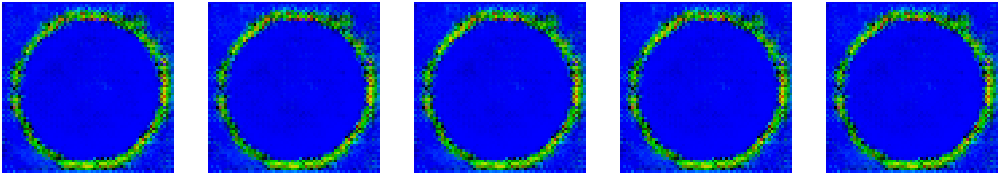

  0%|          | 0/183 [00:00<?, ?it/s]

[22/100][91/183] Loss_D: 0.4402 Loss_G: 2.1758 D(x): 0.8296 D(G(z)): 0.0867 / 0.0902
[22/100][182/183] Loss_D: 0.4486 Loss_G: 2.2740 D(x): 0.8724 D(G(z)): 0.1016 / 0.0807


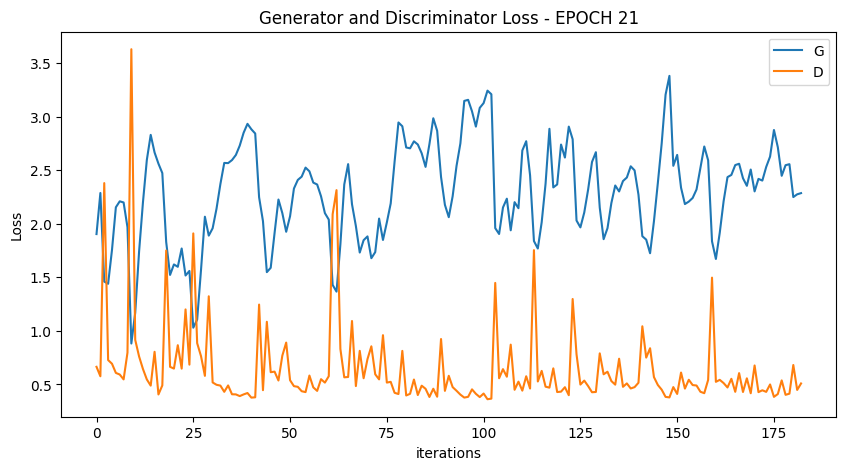

  0%|          | 0/183 [00:00<?, ?it/s]

[23/100][91/183] Loss_D: 0.5796 Loss_G: 2.4462 D(x): 0.6666 D(G(z)): 0.0900 / 0.0669
[23/100][182/183] Loss_D: 0.5299 Loss_G: 2.0697 D(x): 0.9177 D(G(z)): 0.1832 / 0.1015


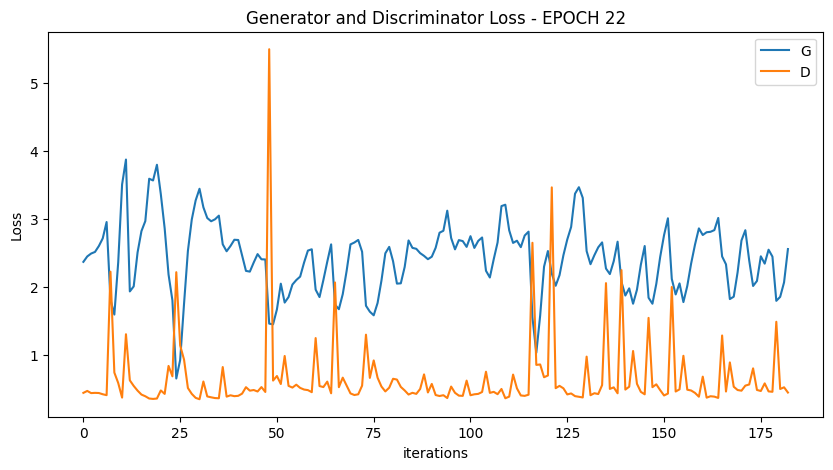

  0%|          | 0/183 [00:00<?, ?it/s]

[24/100][91/183] Loss_D: 0.3967 Loss_G: 2.6817 D(x): 0.9251 D(G(z)): 0.0546 / 0.0511
[24/100][182/183] Loss_D: 0.4104 Loss_G: 2.9399 D(x): 0.8516 D(G(z)): 0.0622 / 0.0384


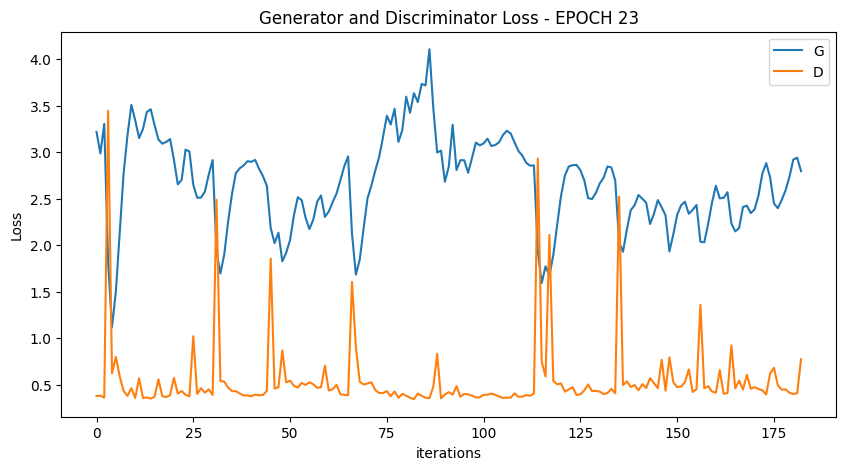

  0%|          | 0/183 [00:00<?, ?it/s]

[25/100][91/183] Loss_D: 0.5805 Loss_G: 2.4630 D(x): 0.7442 D(G(z)): 0.0953 / 0.0653
[25/100][182/183] Loss_D: 0.3778 Loss_G: 2.9553 D(x): 0.8709 D(G(z)): 0.0474 / 0.0377


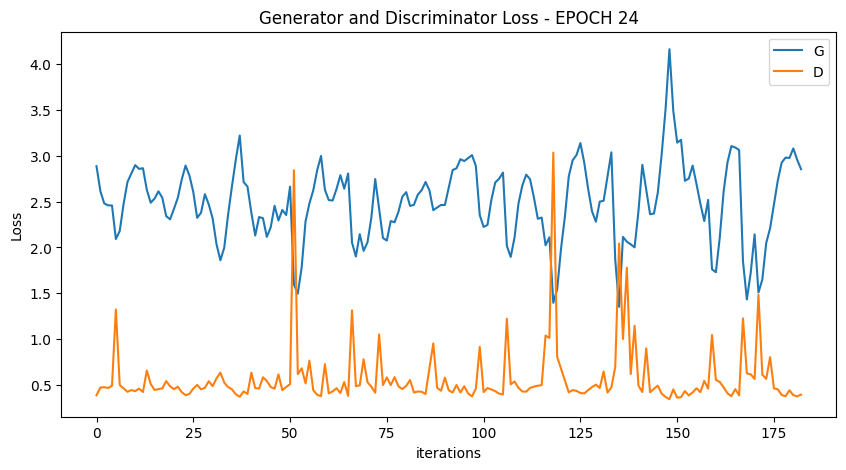

  0%|          | 0/183 [00:00<?, ?it/s]

[26/100][91/183] Loss_D: 0.5023 Loss_G: 2.2344 D(x): 0.9256 D(G(z)): 0.1581 / 0.0844
[26/100][182/183] Loss_D: 0.7035 Loss_G: 2.1849 D(x): 0.5613 D(G(z)): 0.0938 / 0.0893


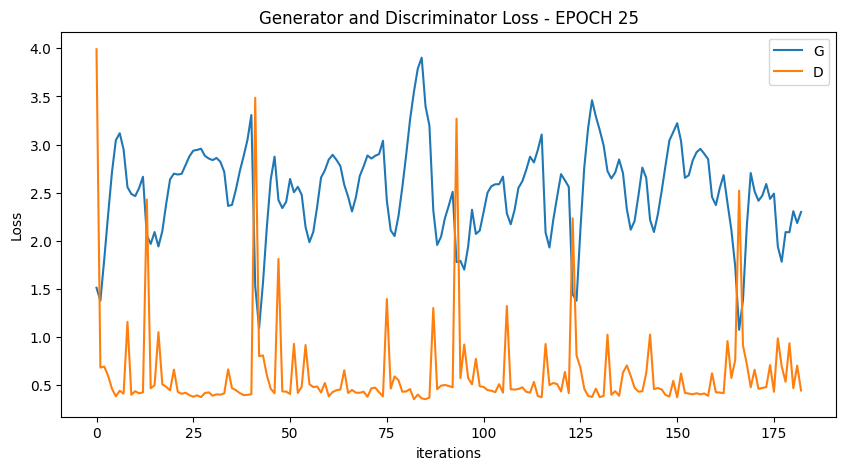

  0%|          | 0/183 [00:00<?, ?it/s]

[27/100][91/183] Loss_D: 0.5039 Loss_G: 1.5348 D(x): 0.8304 D(G(z)): 0.1355 / 0.1859
[27/100][182/183] Loss_D: 1.7978 Loss_G: 1.4991 D(x): 0.2903 D(G(z)): 0.0525 / 0.1937


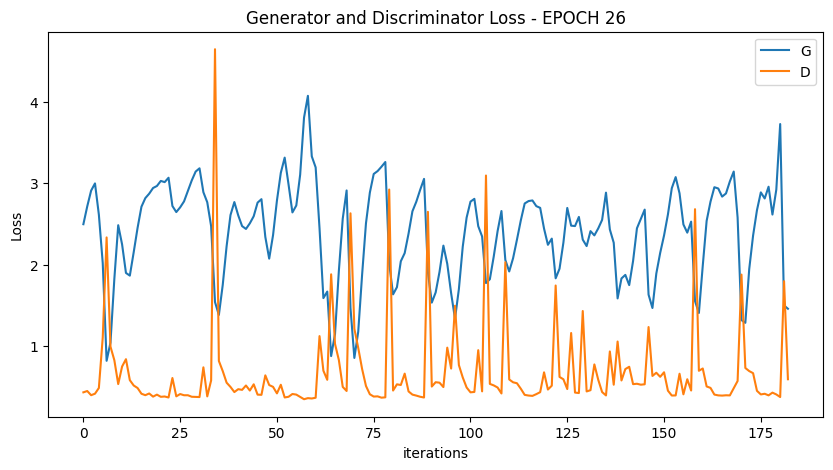

  0%|          | 0/183 [00:00<?, ?it/s]

[28/100][91/183] Loss_D: 0.4622 Loss_G: 3.0593 D(x): 0.7702 D(G(z)): 0.0399 / 0.0335
[28/100][182/183] Loss_D: 0.7888 Loss_G: 2.1134 D(x): 0.5684 D(G(z)): 0.1278 / 0.0967


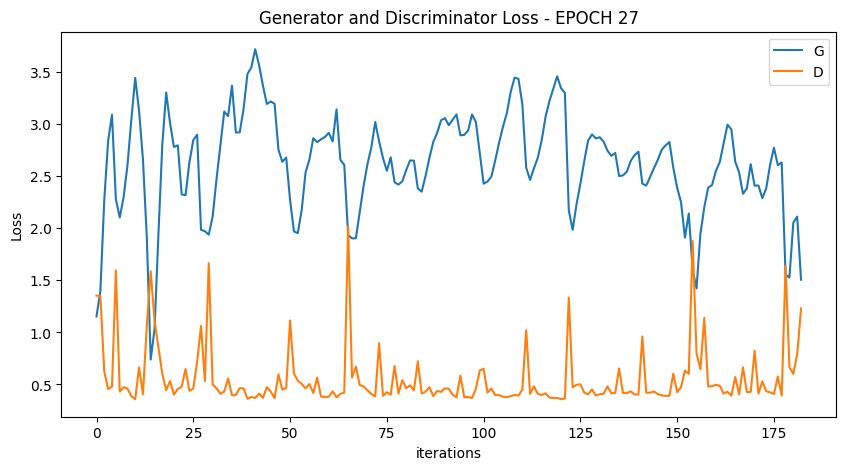

  0%|          | 0/183 [00:00<?, ?it/s]

[29/100][91/183] Loss_D: 0.4897 Loss_G: 2.1227 D(x): 0.9339 D(G(z)): 0.1124 / 0.0957
[29/100][182/183] Loss_D: 0.4637 Loss_G: 2.3262 D(x): 0.9294 D(G(z)): 0.1131 / 0.0761


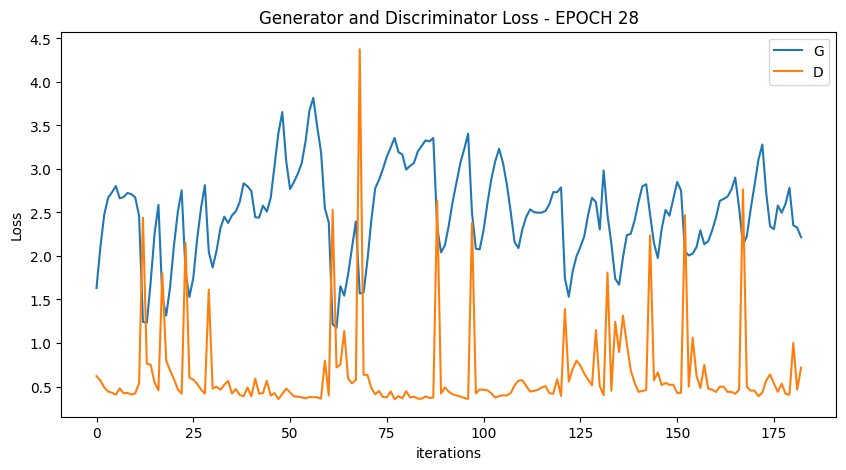

  0%|          | 0/183 [00:00<?, ?it/s]

[30/100][91/183] Loss_D: 0.4043 Loss_G: 3.1802 D(x): 0.9064 D(G(z)): 0.0541 / 0.0295
[30/100][182/183] Loss_D: 0.4309 Loss_G: 2.6350 D(x): 0.9500 D(G(z)): 0.0814 / 0.0538


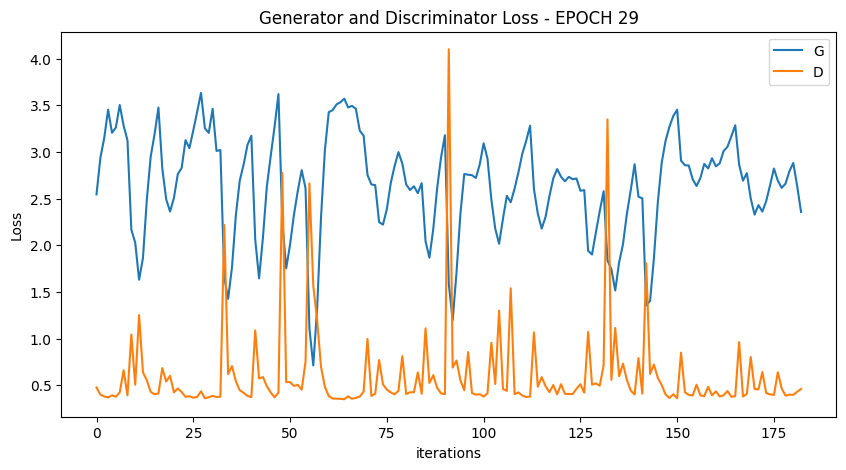

  0%|          | 0/183 [00:00<?, ?it/s]

[31/100][91/183] Loss_D: 0.3800 Loss_G: 3.3158 D(x): 0.8613 D(G(z)): 0.0357 / 0.0252
[31/100][182/183] Loss_D: 0.6155 Loss_G: 2.0200 D(x): 0.7380 D(G(z)): 0.1119 / 0.1075


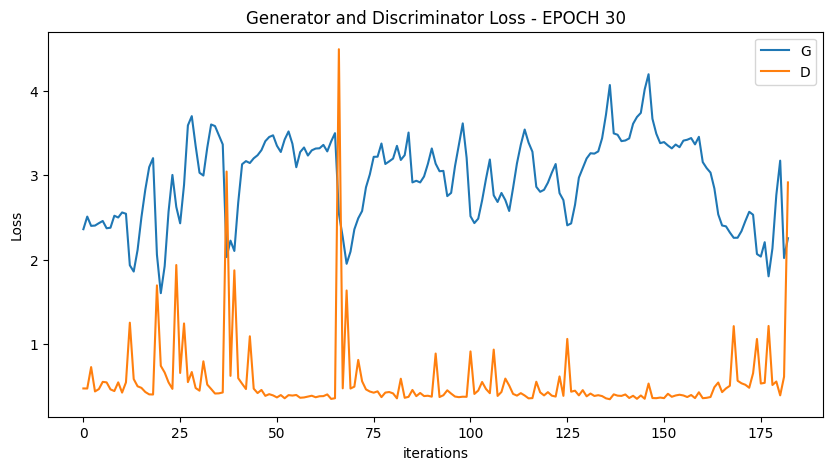

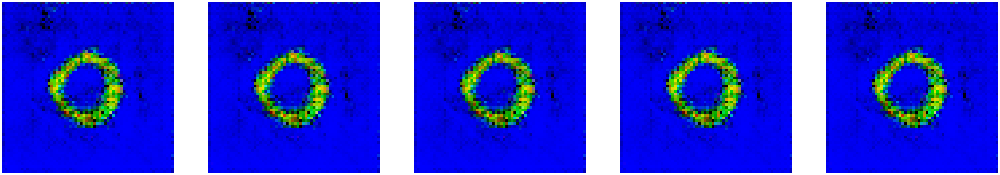

  0%|          | 0/183 [00:00<?, ?it/s]

[32/100][91/183] Loss_D: 0.5088 Loss_G: 2.9193 D(x): 0.7418 D(G(z)): 0.0515 / 0.0396
[32/100][182/183] Loss_D: 0.4551 Loss_G: 2.6839 D(x): 0.9450 D(G(z)): 0.1028 / 0.0510


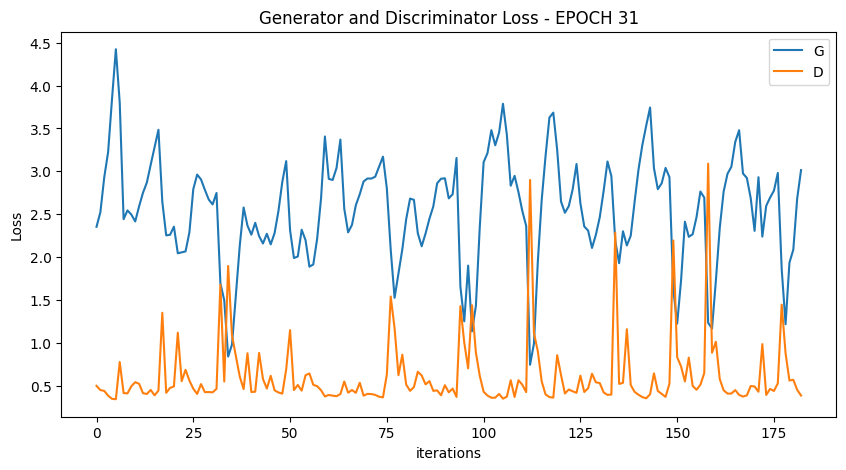

  0%|          | 0/183 [00:00<?, ?it/s]

[33/100][91/183] Loss_D: 1.5075 Loss_G: 2.1097 D(x): 0.2008 D(G(z)): 0.0230 / 0.1055
[33/100][182/183] Loss_D: 0.6024 Loss_G: 1.7796 D(x): 0.9093 D(G(z)): 0.2154 / 0.1754


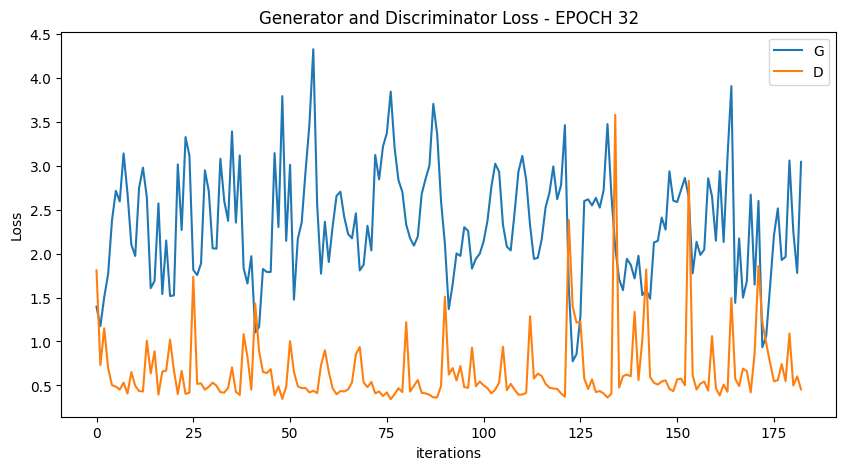

  0%|          | 0/183 [00:00<?, ?it/s]

[34/100][91/183] Loss_D: 0.5791 Loss_G: 1.7622 D(x): 0.9507 D(G(z)): 0.2020 / 0.1446
[34/100][182/183] Loss_D: 0.5217 Loss_G: 2.0058 D(x): 0.8806 D(G(z)): 0.1718 / 0.1167


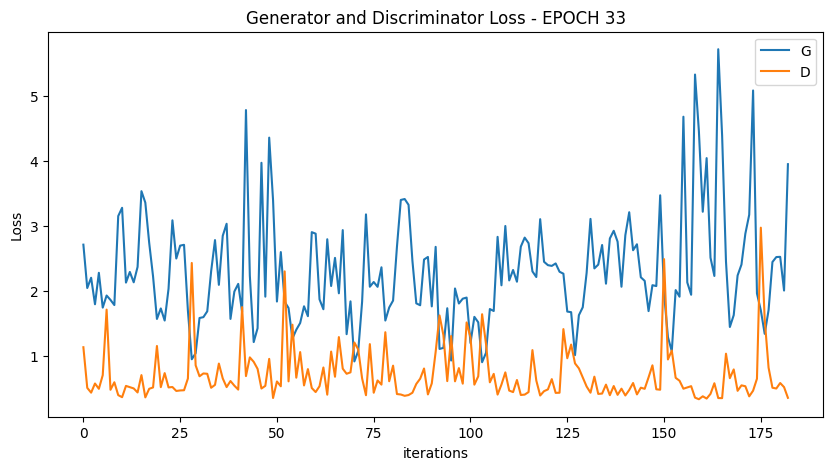

  0%|          | 0/183 [00:00<?, ?it/s]

[35/100][91/183] Loss_D: 0.4368 Loss_G: 2.6031 D(x): 0.9078 D(G(z)): 0.0975 / 0.0558
[35/100][182/183] Loss_D: 0.3598 Loss_G: 3.8895 D(x): 0.8607 D(G(z)): 0.0254 / 0.0223


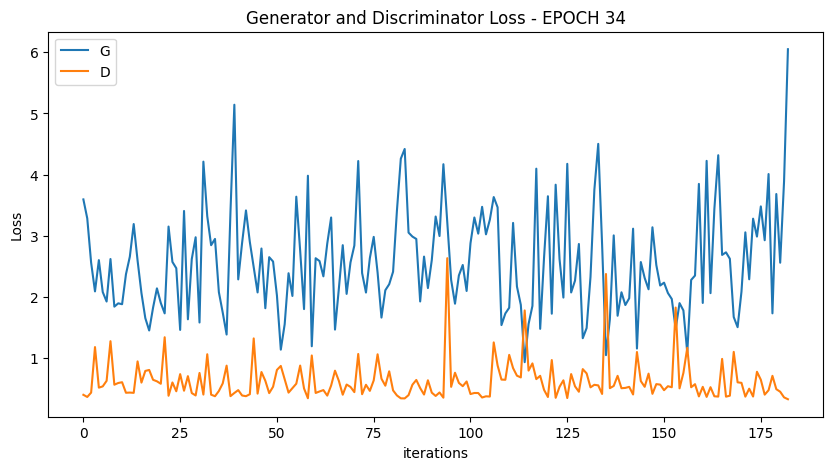

  0%|          | 0/183 [00:00<?, ?it/s]

[36/100][91/183] Loss_D: 0.7700 Loss_G: 1.8467 D(x): 0.7038 D(G(z)): 0.2694 / 0.1306
[36/100][182/183] Loss_D: 0.5345 Loss_G: 2.1350 D(x): 0.9433 D(G(z)): 0.1753 / 0.1003


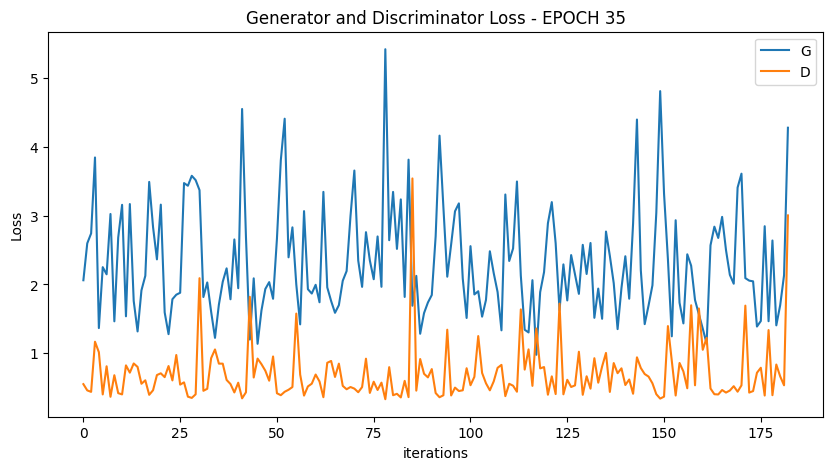

  0%|          | 0/183 [00:00<?, ?it/s]

[37/100][91/183] Loss_D: 0.6777 Loss_G: 1.5224 D(x): 0.7038 D(G(z)): 0.2106 / 0.1920
[37/100][182/183] Loss_D: 0.4740 Loss_G: 2.4596 D(x): 0.8607 D(G(z)): 0.1315 / 0.0655


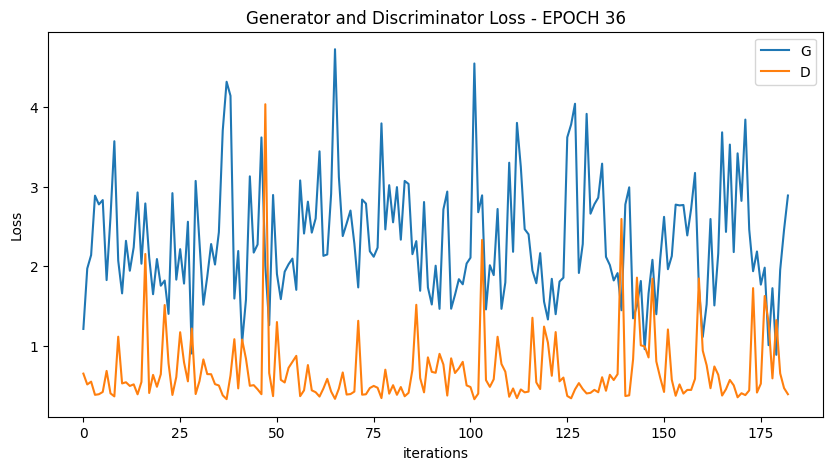

  0%|          | 0/183 [00:00<?, ?it/s]

[38/100][91/183] Loss_D: 1.1263 Loss_G: 1.3603 D(x): 0.4570 D(G(z)): 0.2527 / 0.2374
[38/100][182/183] Loss_D: 0.3578 Loss_G: 3.5319 D(x): 0.8522 D(G(z)): 0.0224 / 0.0218


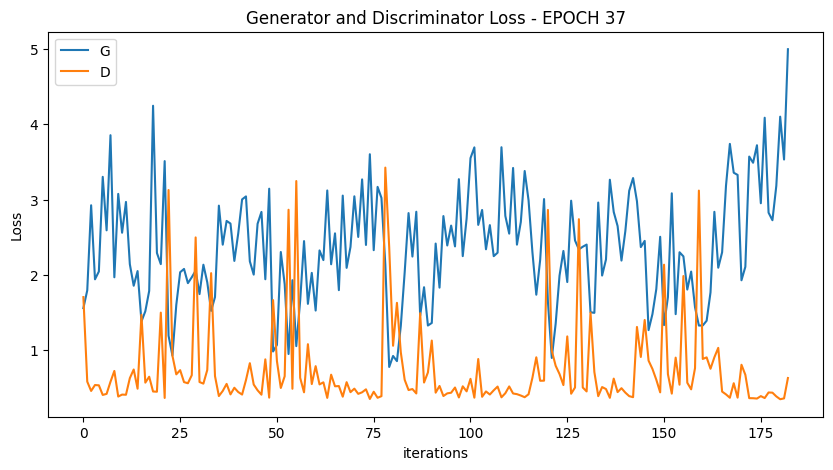

  0%|          | 0/183 [00:00<?, ?it/s]

[39/100][91/183] Loss_D: 0.3661 Loss_G: 3.2386 D(x): 0.9125 D(G(z)): 0.0361 / 0.0280
[39/100][182/183] Loss_D: 0.4662 Loss_G: 2.0099 D(x): 0.8709 D(G(z)): 0.1178 / 0.1146


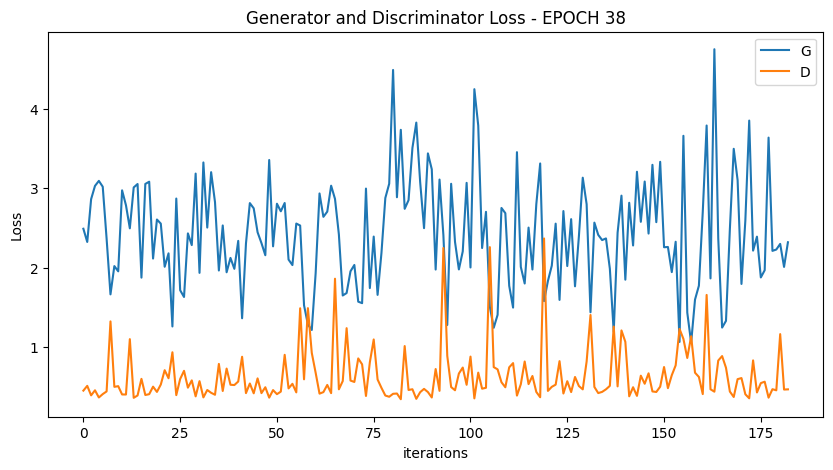

  0%|          | 0/183 [00:00<?, ?it/s]

[40/100][91/183] Loss_D: 0.3926 Loss_G: 2.6156 D(x): 0.8823 D(G(z)): 0.0629 / 0.0550
[40/100][182/183] Loss_D: 0.9764 Loss_G: 1.5046 D(x): 0.9246 D(G(z)): 0.4736 / 0.1926


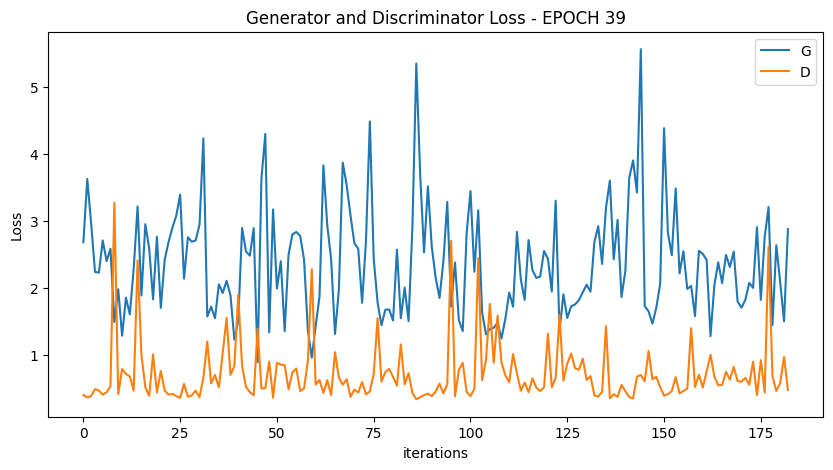

  0%|          | 0/183 [00:00<?, ?it/s]

[41/100][91/183] Loss_D: 0.5216 Loss_G: 2.4971 D(x): 0.6899 D(G(z)): 0.0654 / 0.0681
[41/100][182/183] Loss_D: 0.3331 Loss_G: 4.6583 D(x): 0.9173 D(G(z)): 0.0061 / 0.0057


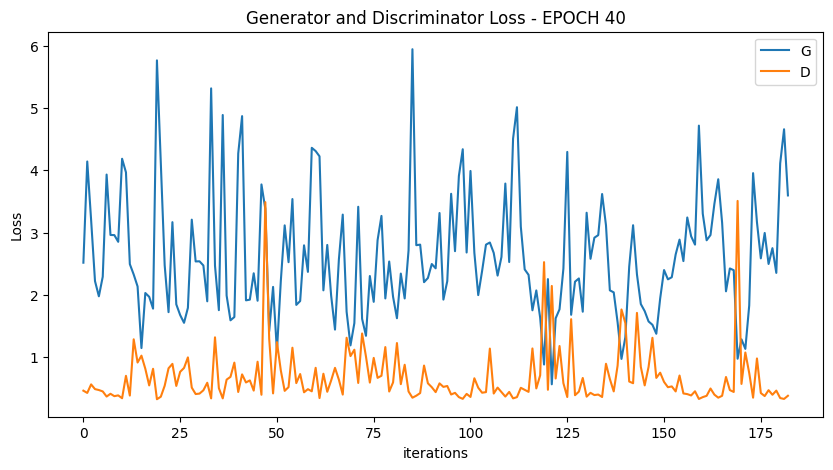

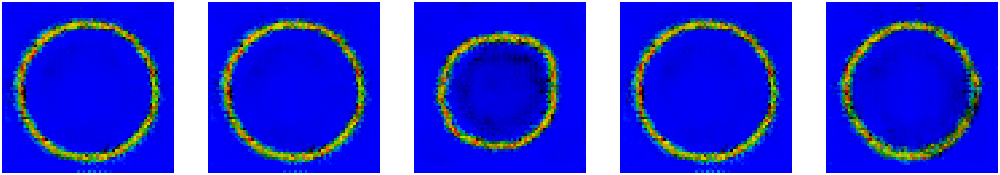

  0%|          | 0/183 [00:00<?, ?it/s]

[42/100][91/183] Loss_D: 0.3895 Loss_G: 2.8189 D(x): 0.8538 D(G(z)): 0.0531 / 0.0444
[42/100][182/183] Loss_D: 1.6064 Loss_G: 0.9480 D(x): 0.2969 D(G(z)): 0.2076 / 0.3678


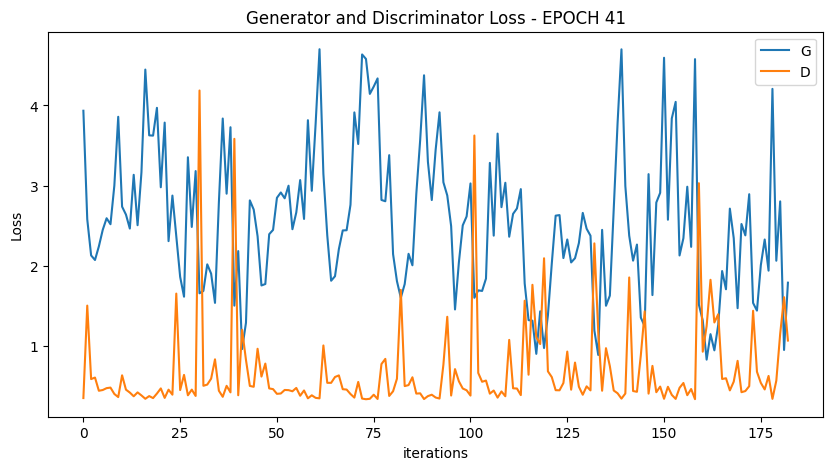

  0%|          | 0/183 [00:00<?, ?it/s]

[43/100][91/183] Loss_D: 0.8506 Loss_G: 1.5724 D(x): 0.5649 D(G(z)): 0.2213 / 0.1831
[43/100][182/183] Loss_D: 0.5240 Loss_G: 2.0966 D(x): 0.7407 D(G(z)): 0.1056 / 0.1006


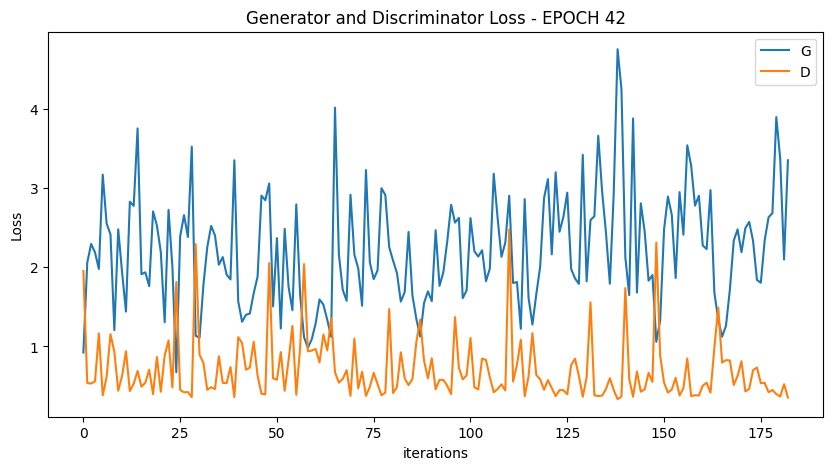

  0%|          | 0/183 [00:00<?, ?it/s]

[44/100][91/183] Loss_D: 0.3508 Loss_G: 4.6090 D(x): 0.9482 D(G(z)): 0.0069 / 0.0060
[44/100][182/183] Loss_D: 0.8479 Loss_G: 1.6502 D(x): 0.9259 D(G(z)): 0.3802 / 0.1983


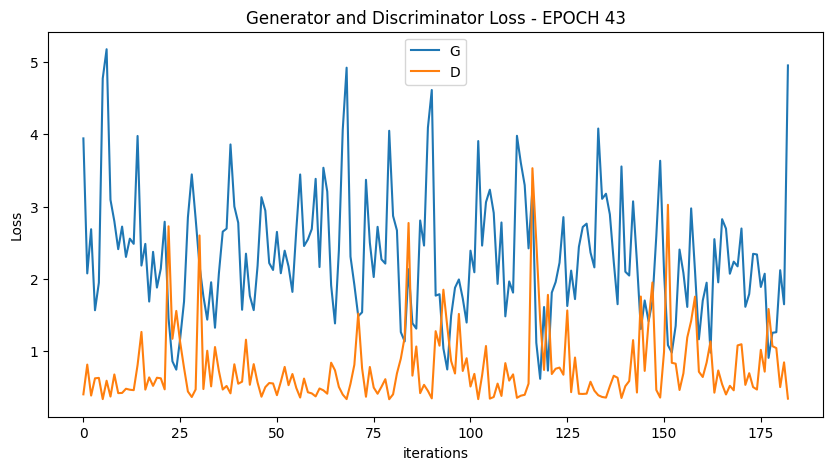

  0%|          | 0/183 [00:00<?, ?it/s]

[45/100][91/183] Loss_D: 0.8806 Loss_G: 1.5293 D(x): 0.7192 D(G(z)): 0.3462 / 0.1880
[45/100][182/183] Loss_D: 0.8111 Loss_G: 2.5689 D(x): 0.5084 D(G(z)): 0.0631 / 0.0580


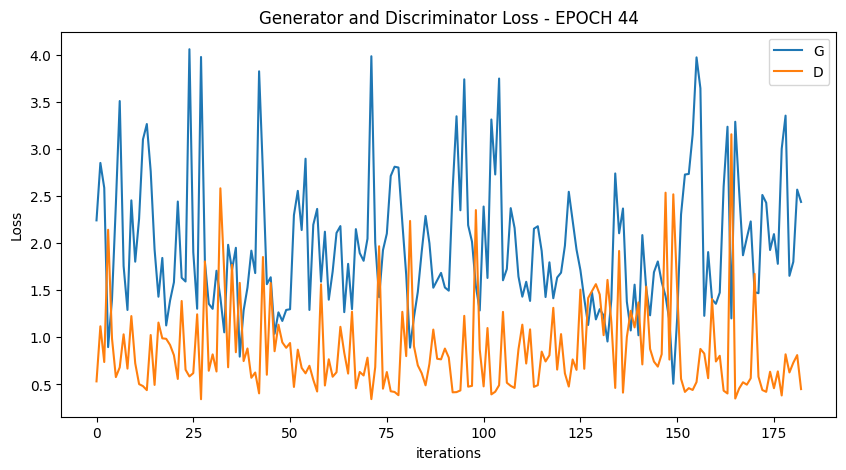

  0%|          | 0/183 [00:00<?, ?it/s]

[46/100][91/183] Loss_D: 0.4612 Loss_G: 1.8301 D(x): 0.8690 D(G(z)): 0.1171 / 0.1379
[46/100][182/183] Loss_D: 0.8498 Loss_G: 1.2853 D(x): 0.8346 D(G(z)): 0.3901 / 0.2520


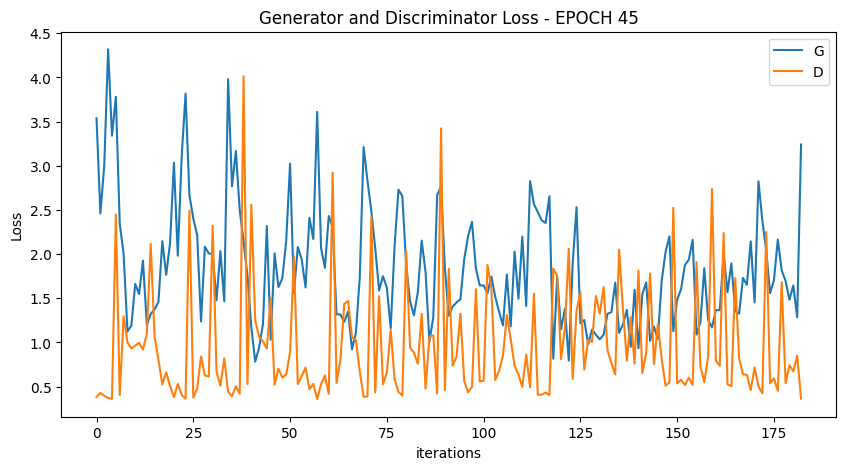

  0%|          | 0/183 [00:00<?, ?it/s]

[47/100][91/183] Loss_D: 0.8021 Loss_G: 1.9267 D(x): 0.8900 D(G(z)): 0.3142 / 0.2549
[47/100][182/183] Loss_D: 1.1058 Loss_G: 2.0363 D(x): 0.4346 D(G(z)): 0.1512 / 0.1663


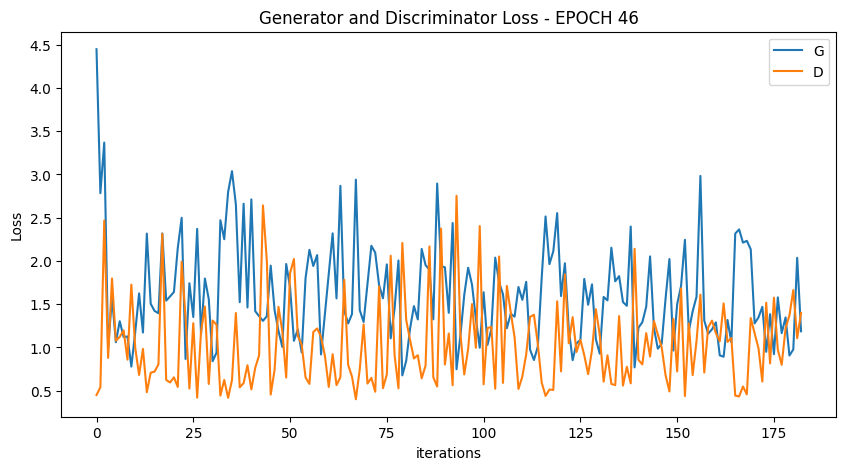

  0%|          | 0/183 [00:00<?, ?it/s]

[48/100][91/183] Loss_D: 1.2699 Loss_G: 1.5036 D(x): 0.3281 D(G(z)): 0.1376 / 0.1946
[48/100][182/183] Loss_D: 0.9019 Loss_G: 1.2359 D(x): 0.7270 D(G(z)): 0.3767 / 0.2620


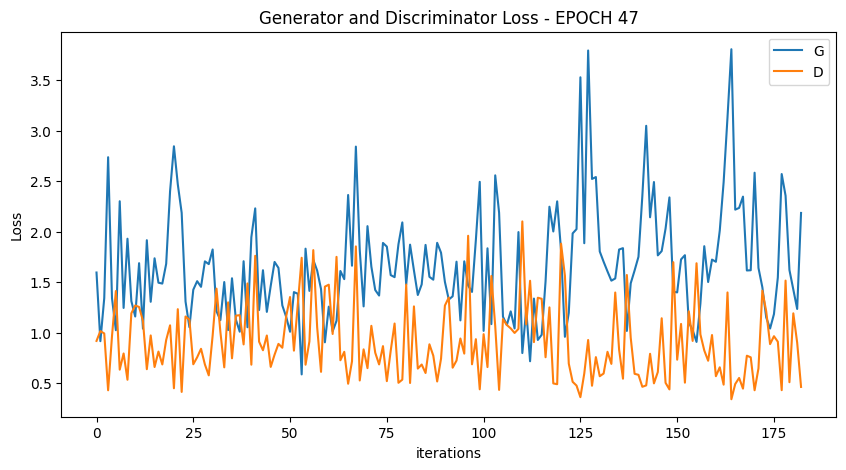

  0%|          | 0/183 [00:00<?, ?it/s]

[49/100][91/183] Loss_D: 0.3680 Loss_G: 3.2275 D(x): 0.8736 D(G(z)): 0.0319 / 0.0278
[49/100][182/183] Loss_D: 0.6164 Loss_G: 3.9185 D(x): 0.5637 D(G(z)): 0.0088 / 0.0135


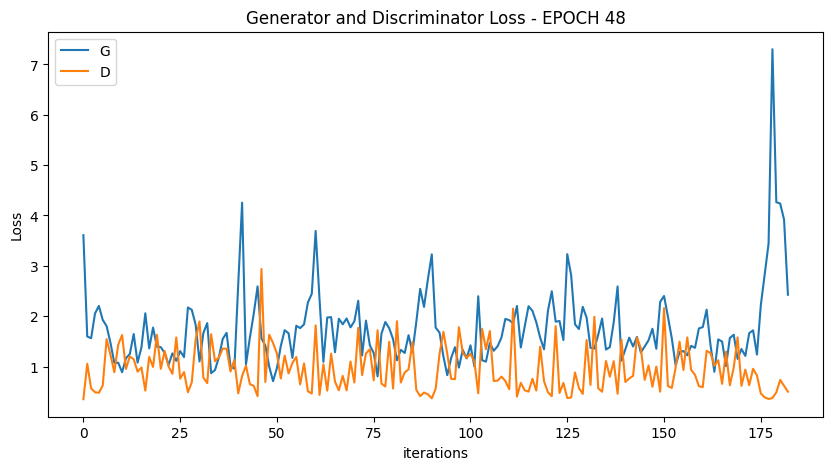

  0%|          | 0/183 [00:00<?, ?it/s]

[50/100][91/183] Loss_D: 0.7979 Loss_G: 1.8373 D(x): 0.5276 D(G(z)): 0.1314 / 0.1344
[50/100][182/183] Loss_D: 0.9599 Loss_G: 1.2074 D(x): 0.7010 D(G(z)): 0.3975 / 0.2721


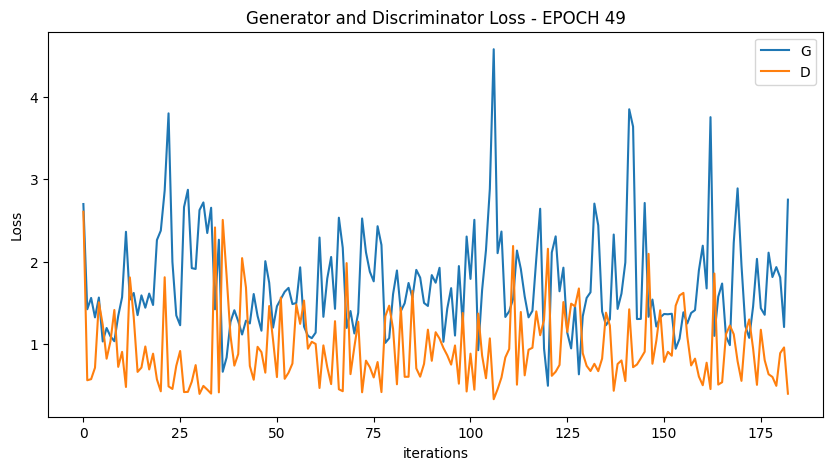

  0%|          | 0/183 [00:00<?, ?it/s]

[51/100][91/183] Loss_D: 0.9526 Loss_G: 1.2863 D(x): 0.6724 D(G(z)): 0.3731 / 0.2473
[51/100][182/183] Loss_D: 0.5504 Loss_G: 1.6244 D(x): 0.8912 D(G(z)): 0.2013 / 0.1683


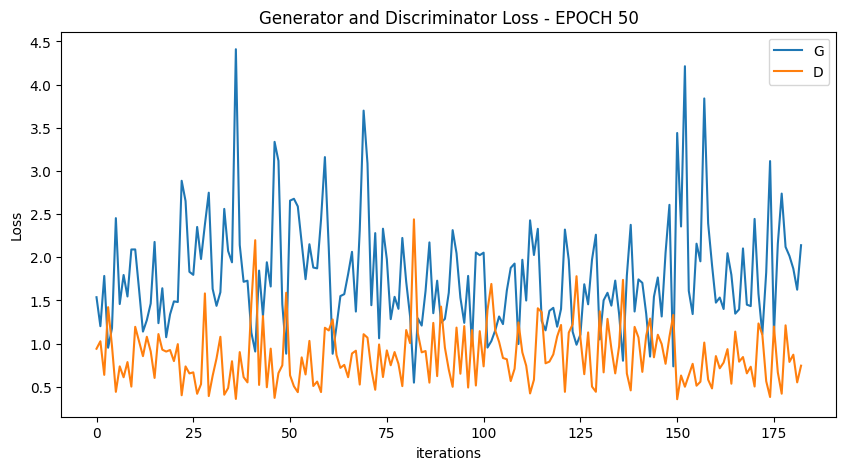

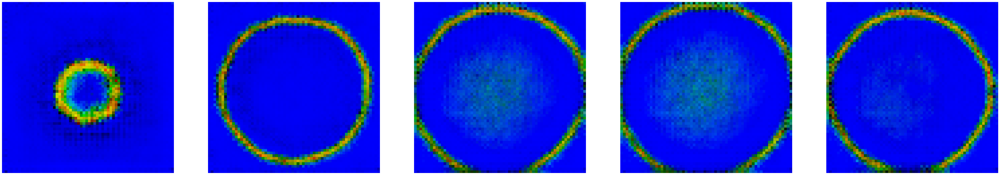

  0%|          | 0/183 [00:00<?, ?it/s]

[52/100][91/183] Loss_D: 0.7787 Loss_G: 1.7695 D(x): 0.5896 D(G(z)): 0.1395 / 0.1435
[52/100][182/183] Loss_D: 0.6235 Loss_G: 2.1428 D(x): 0.6970 D(G(z)): 0.1568 / 0.1009


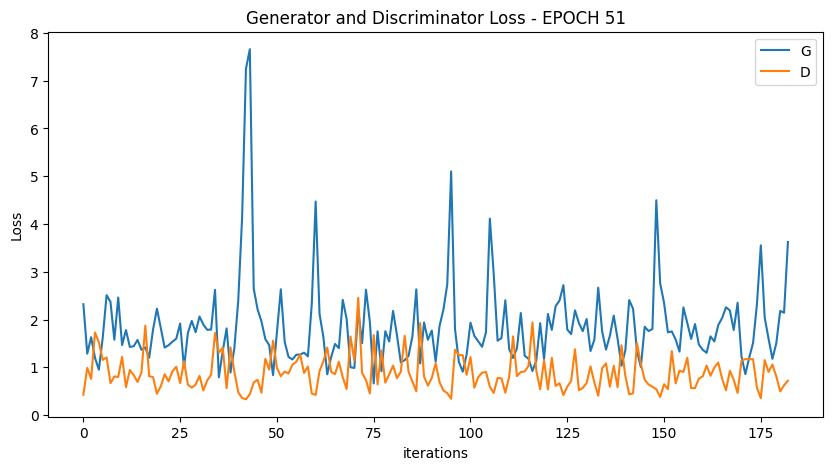

  0%|          | 0/183 [00:00<?, ?it/s]

[53/100][91/183] Loss_D: 1.6682 Loss_G: 1.2848 D(x): 0.8292 D(G(z)): 0.7303 / 0.2482
[53/100][182/183] Loss_D: 0.7854 Loss_G: 1.6378 D(x): 0.6858 D(G(z)): 0.2691 / 0.1853


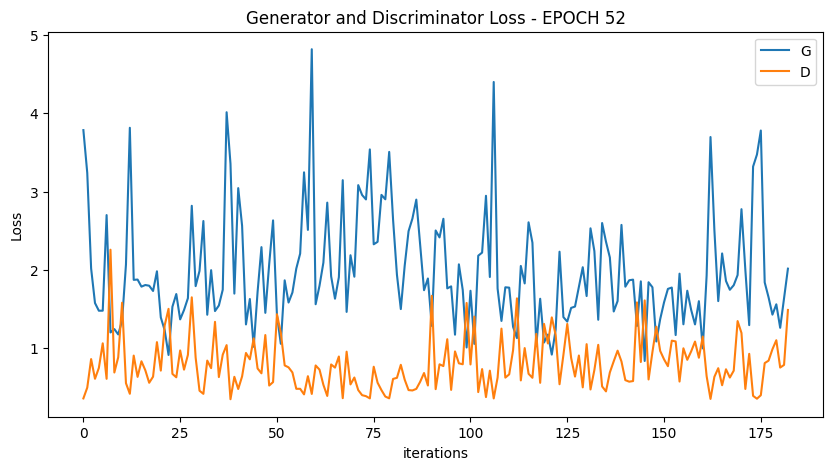

  0%|          | 0/183 [00:00<?, ?it/s]

[54/100][91/183] Loss_D: 1.7471 Loss_G: 2.0139 D(x): 0.1744 D(G(z)): 0.0527 / 0.1127
[54/100][182/183] Loss_D: 0.7281 Loss_G: 1.6480 D(x): 0.9577 D(G(z)): 0.2928 / 0.1698


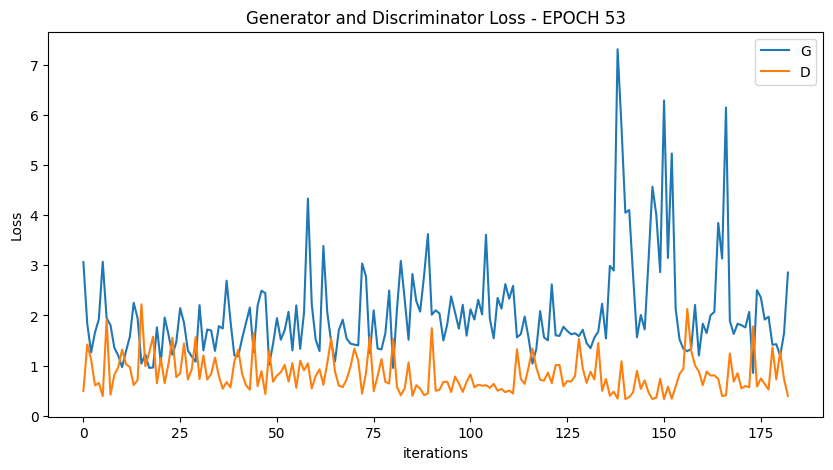

  0%|          | 0/183 [00:00<?, ?it/s]

[55/100][91/183] Loss_D: 0.8327 Loss_G: 2.3406 D(x): 0.4497 D(G(z)): 0.0521 / 0.0756
[55/100][182/183] Loss_D: 0.5668 Loss_G: 1.5604 D(x): 0.8651 D(G(z)): 0.2044 / 0.2001


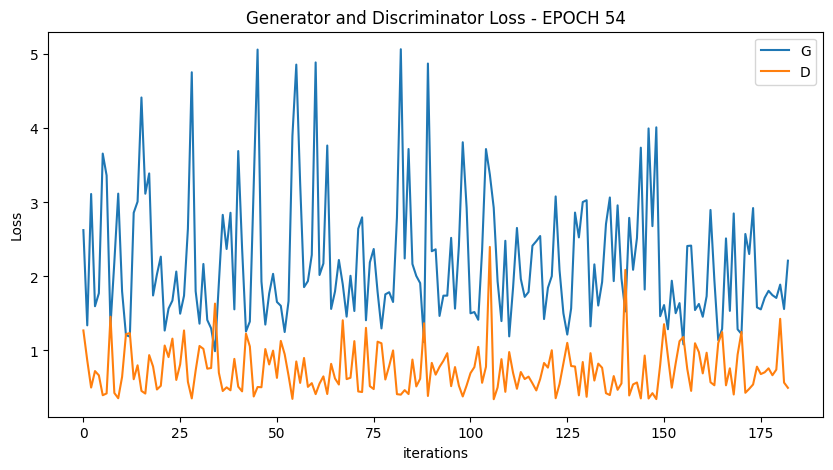

  0%|          | 0/183 [00:00<?, ?it/s]

[56/100][91/183] Loss_D: 0.9218 Loss_G: 1.8154 D(x): 0.7352 D(G(z)): 0.3718 / 0.1397
[56/100][182/183] Loss_D: 0.5388 Loss_G: 2.2747 D(x): 0.6510 D(G(z)): 0.0446 / 0.0977


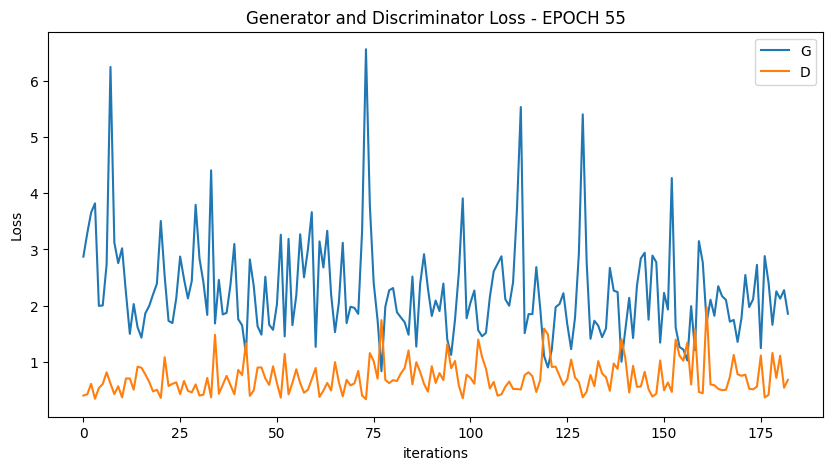

  0%|          | 0/183 [00:00<?, ?it/s]

[57/100][91/183] Loss_D: 1.2790 Loss_G: 1.0748 D(x): 0.8124 D(G(z)): 0.6014 / 0.3173
[57/100][182/183] Loss_D: 0.4383 Loss_G: 2.3980 D(x): 0.9139 D(G(z)): 0.0991 / 0.0709


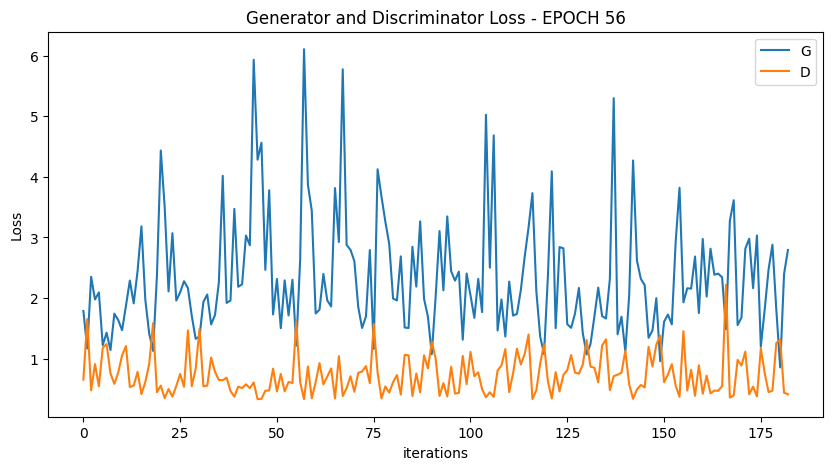

  0%|          | 0/183 [00:00<?, ?it/s]

[58/100][91/183] Loss_D: 0.4527 Loss_G: 2.5352 D(x): 0.8830 D(G(z)): 0.1159 / 0.0691
[58/100][182/183] Loss_D: 0.5171 Loss_G: 1.9486 D(x): 0.8415 D(G(z)): 0.1593 / 0.1209


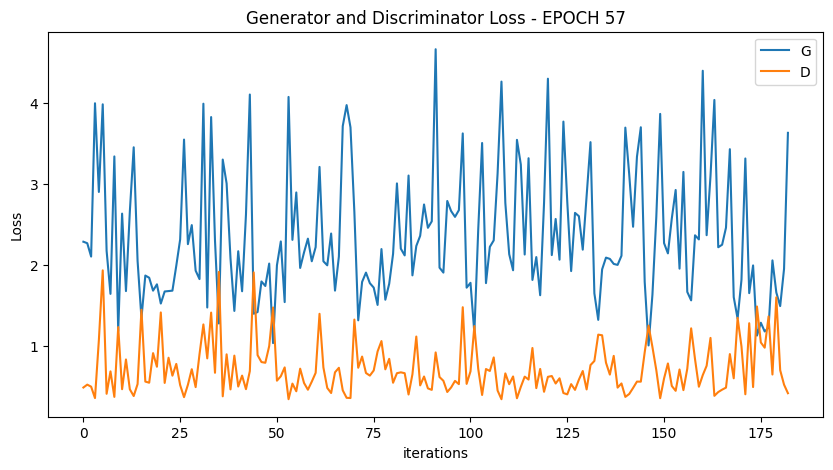

  0%|          | 0/183 [00:00<?, ?it/s]

[59/100][91/183] Loss_D: 1.8000 Loss_G: 1.3146 D(x): 0.3820 D(G(z)): 0.3020 / 0.2431
[59/100][182/183] Loss_D: 0.5583 Loss_G: 3.4867 D(x): 0.6213 D(G(z)): 0.0202 / 0.0251


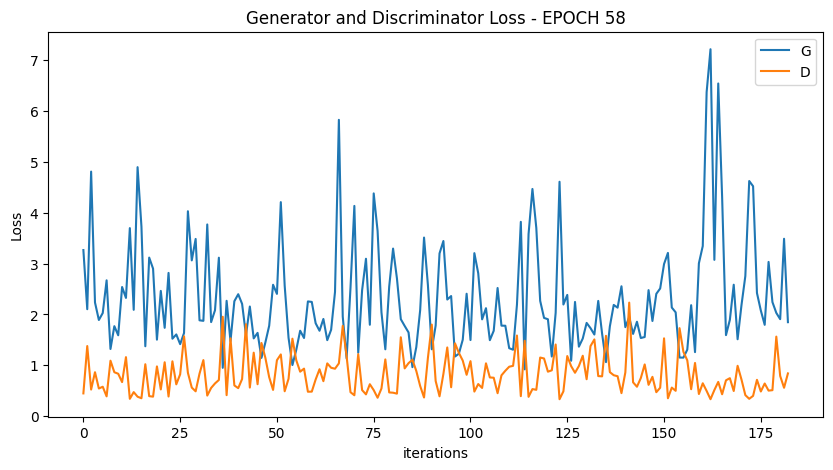

  0%|          | 0/183 [00:00<?, ?it/s]

[60/100][91/183] Loss_D: 1.7821 Loss_G: 0.7028 D(x): 0.8349 D(G(z)): 0.7506 / 0.5038
[60/100][182/183] Loss_D: 0.5187 Loss_G: 1.9866 D(x): 0.8962 D(G(z)): 0.1755 / 0.1120


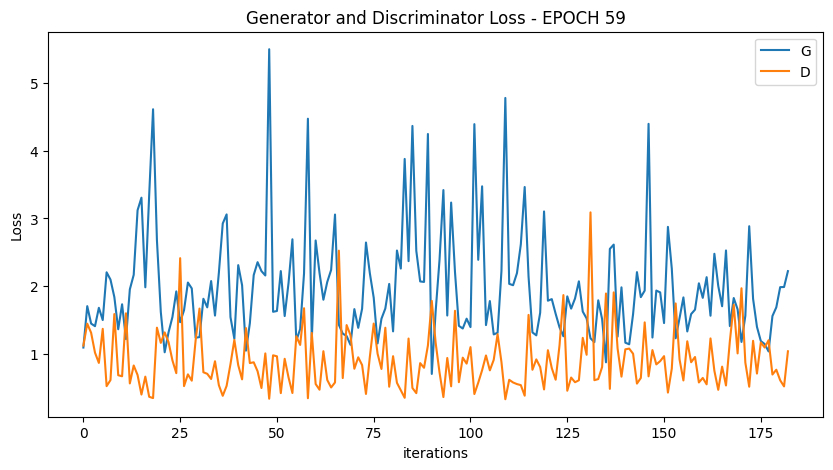

  0%|          | 0/183 [00:00<?, ?it/s]

[61/100][91/183] Loss_D: 1.0538 Loss_G: 1.5890 D(x): 0.4219 D(G(z)): 0.1715 / 0.1883
[61/100][182/183] Loss_D: 0.3953 Loss_G: 3.6987 D(x): 0.8045 D(G(z)): 0.0226 / 0.0233


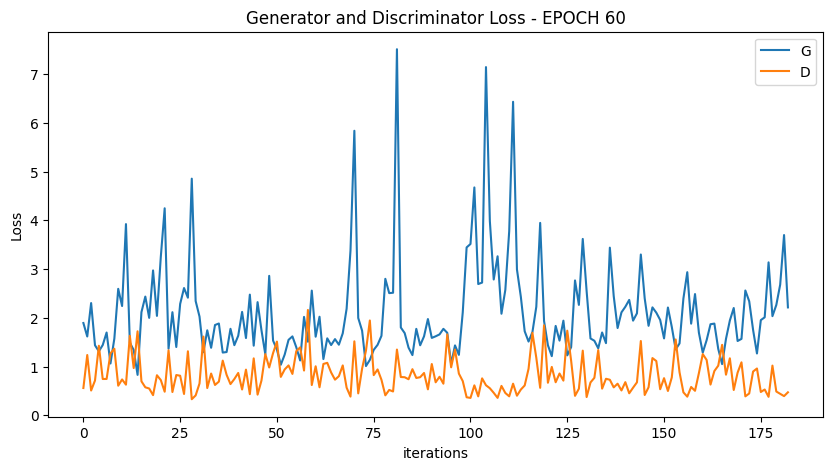

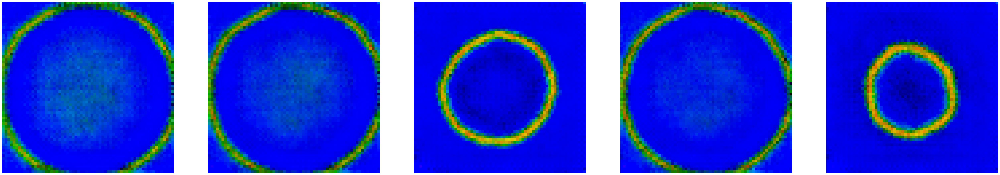

  0%|          | 0/183 [00:00<?, ?it/s]

[62/100][91/183] Loss_D: 0.3720 Loss_G: 3.5656 D(x): 0.8452 D(G(z)): 0.0219 / 0.0195
[62/100][182/183] Loss_D: 1.4090 Loss_G: 0.9319 D(x): 0.8447 D(G(z)): 0.6501 / 0.3740


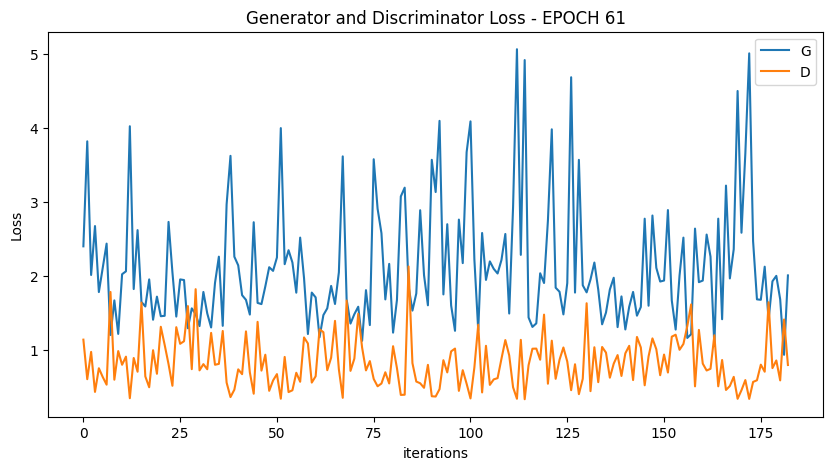

  0%|          | 0/183 [00:00<?, ?it/s]

[63/100][91/183] Loss_D: 0.9460 Loss_G: 1.1911 D(x): 0.8161 D(G(z)): 0.4298 / 0.2760
[63/100][182/183] Loss_D: 0.6279 Loss_G: 1.8142 D(x): 0.9498 D(G(z)): 0.2456 / 0.1357


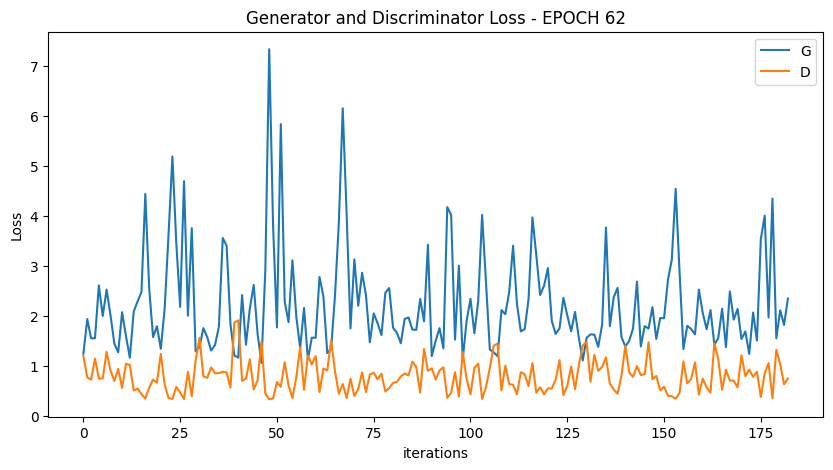

  0%|          | 0/183 [00:00<?, ?it/s]

[64/100][91/183] Loss_D: 0.6150 Loss_G: 3.5935 D(x): 0.6018 D(G(z)): 0.0216 / 0.0223
[64/100][182/183] Loss_D: 0.3290 Loss_G: 4.8761 D(x): 0.9002 D(G(z)): 0.0038 / 0.0058


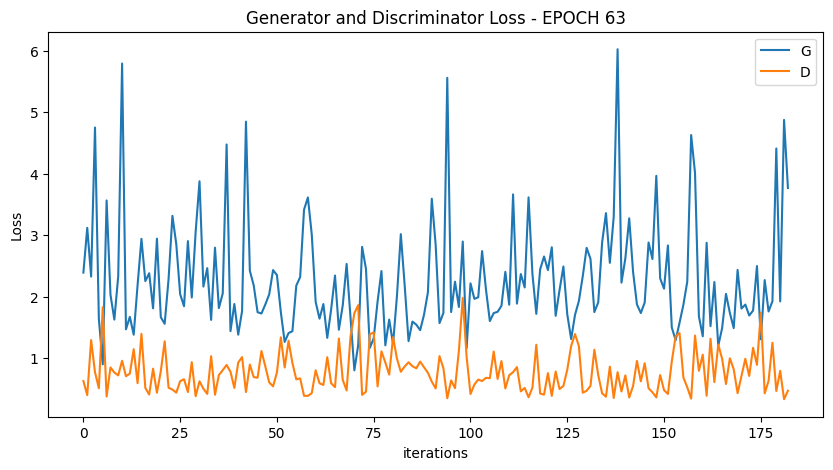

  0%|          | 0/183 [00:00<?, ?it/s]

[65/100][91/183] Loss_D: 0.4760 Loss_G: 4.4141 D(x): 0.6867 D(G(z)): 0.0060 / 0.0074
[65/100][182/183] Loss_D: 0.6221 Loss_G: 2.4525 D(x): 0.7014 D(G(z)): 0.1236 / 0.0754


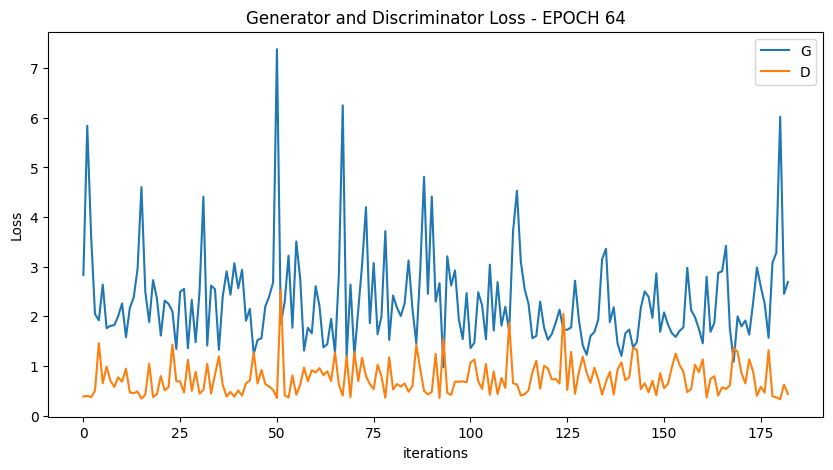

  0%|          | 0/183 [00:00<?, ?it/s]

[66/100][91/183] Loss_D: 0.4665 Loss_G: 2.2846 D(x): 0.8293 D(G(z)): 0.1112 / 0.0814
[66/100][182/183] Loss_D: 0.3448 Loss_G: 3.8586 D(x): 0.9016 D(G(z)): 0.0182 / 0.0138


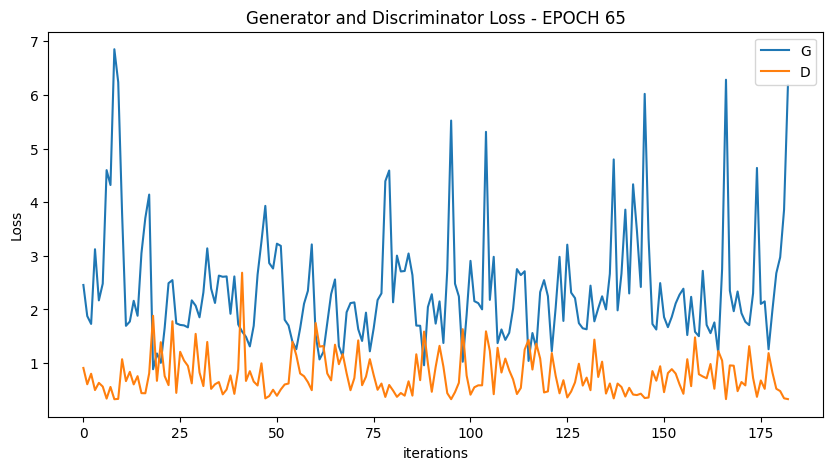

  0%|          | 0/183 [00:00<?, ?it/s]

[67/100][91/183] Loss_D: 0.3753 Loss_G: 3.3314 D(x): 0.8086 D(G(z)): 0.0146 / 0.0248
[67/100][182/183] Loss_D: 0.5224 Loss_G: 2.0271 D(x): 0.9104 D(G(z)): 0.1768 / 0.1067


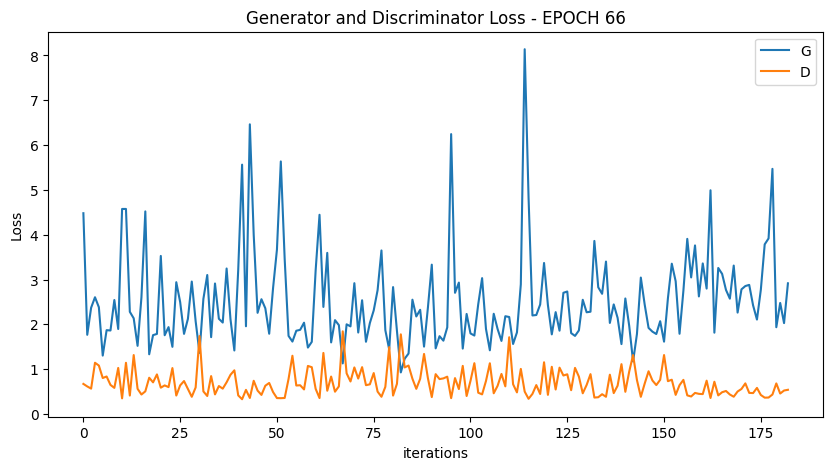

  0%|          | 0/183 [00:00<?, ?it/s]

[68/100][91/183] Loss_D: 1.0718 Loss_G: 1.8979 D(x): 0.5566 D(G(z)): 0.3465 / 0.1256
[68/100][182/183] Loss_D: 1.2309 Loss_G: 1.3780 D(x): 0.9822 D(G(z)): 0.5499 / 0.2228


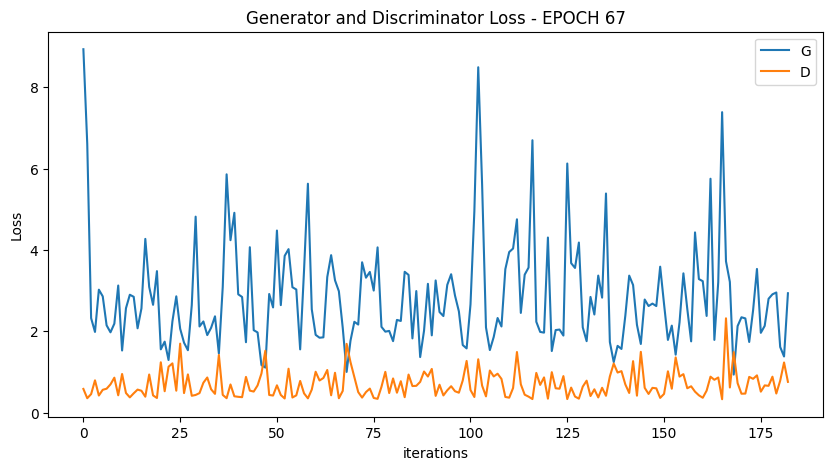

  0%|          | 0/183 [00:00<?, ?it/s]

[69/100][91/183] Loss_D: 1.1461 Loss_G: 1.7635 D(x): 0.3374 D(G(z)): 0.1102 / 0.1632
[69/100][182/183] Loss_D: 0.4766 Loss_G: 3.0430 D(x): 0.7549 D(G(z)): 0.0787 / 0.0347


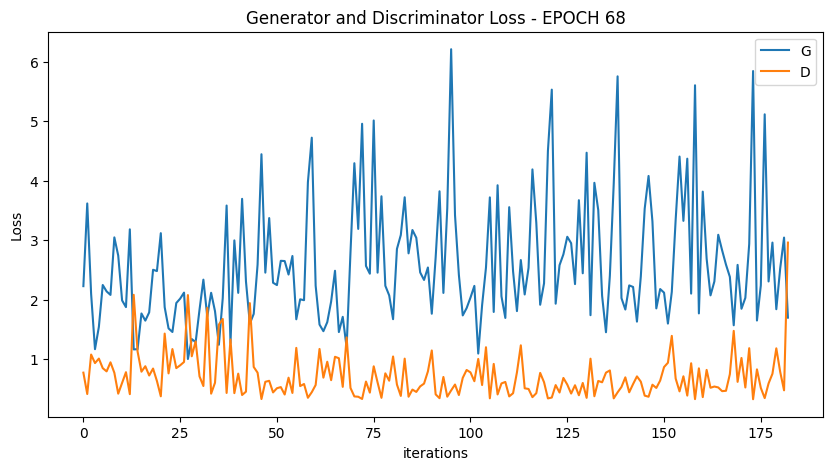

  0%|          | 0/183 [00:00<?, ?it/s]

[70/100][91/183] Loss_D: 0.5415 Loss_G: 1.8580 D(x): 0.8968 D(G(z)): 0.1927 / 0.1289
[70/100][182/183] Loss_D: 1.2634 Loss_G: 1.2727 D(x): 0.8478 D(G(z)): 0.5100 / 0.2560


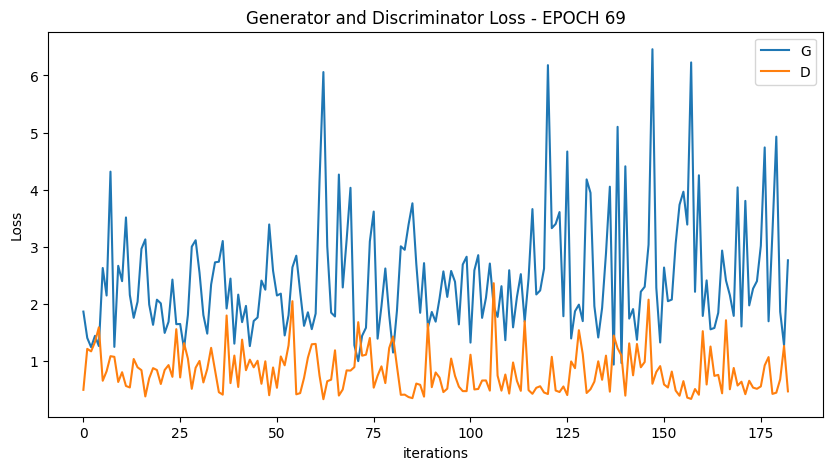

  0%|          | 0/183 [00:00<?, ?it/s]

[71/100][91/183] Loss_D: 0.6903 Loss_G: 2.4216 D(x): 0.8656 D(G(z)): 0.2638 / 0.0958
[71/100][182/183] Loss_D: 0.3334 Loss_G: 4.4122 D(x): 0.9097 D(G(z)): 0.0065 / 0.0076


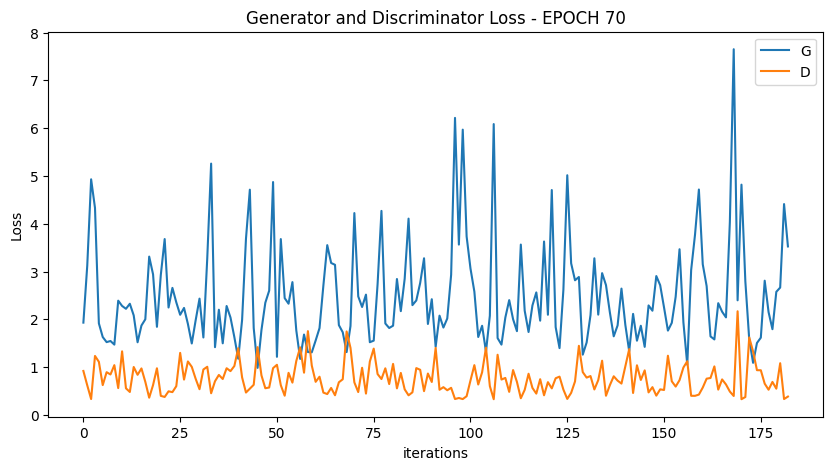

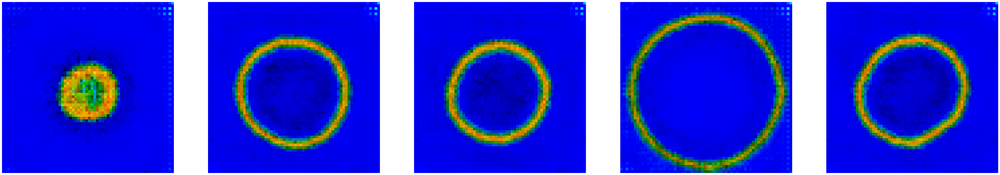

  0%|          | 0/183 [00:00<?, ?it/s]

[72/100][91/183] Loss_D: 0.7302 Loss_G: 1.6799 D(x): 0.9059 D(G(z)): 0.3160 / 0.1796
[72/100][182/183] Loss_D: 0.3772 Loss_G: 3.2095 D(x): 0.8958 D(G(z)): 0.0457 / 0.0318


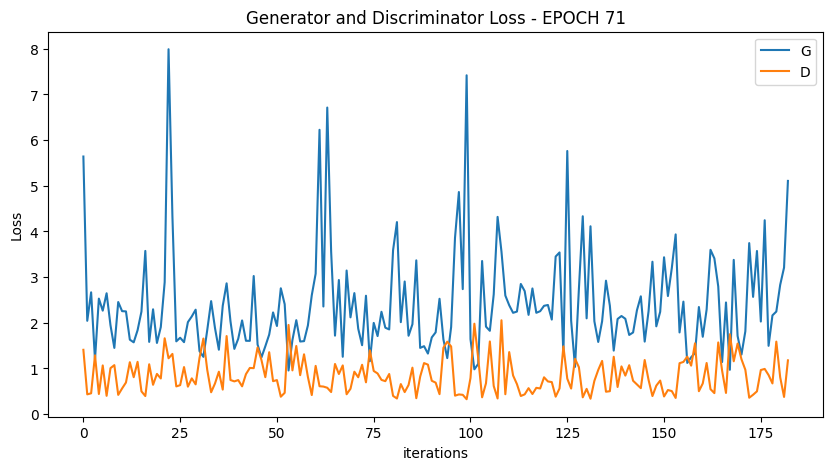

  0%|          | 0/183 [00:00<?, ?it/s]

[73/100][91/183] Loss_D: 0.9694 Loss_G: 1.5395 D(x): 0.5701 D(G(z)): 0.2645 / 0.1875
[73/100][182/183] Loss_D: 0.3629 Loss_G: 3.4610 D(x): 0.8483 D(G(z)): 0.0256 / 0.0267


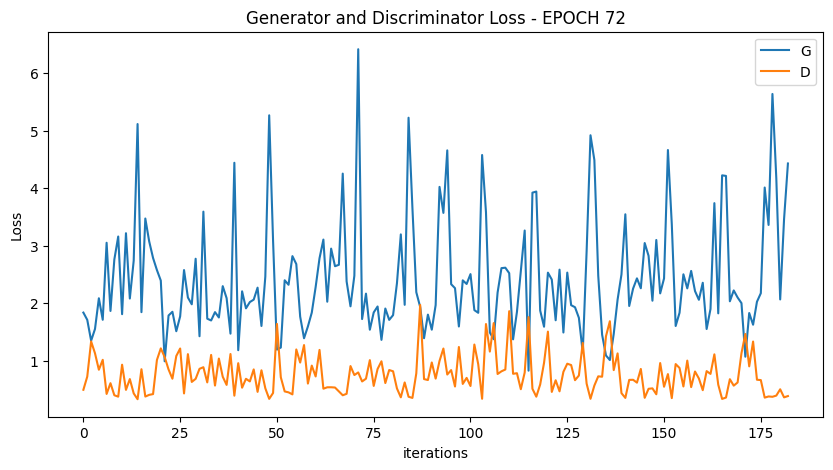

  0%|          | 0/183 [00:00<?, ?it/s]

[74/100][91/183] Loss_D: 0.9706 Loss_G: 1.7446 D(x): 0.8562 D(G(z)): 0.4315 / 0.1792
[74/100][182/183] Loss_D: 0.8763 Loss_G: 1.5749 D(x): 0.9207 D(G(z)): 0.4008 / 0.1789


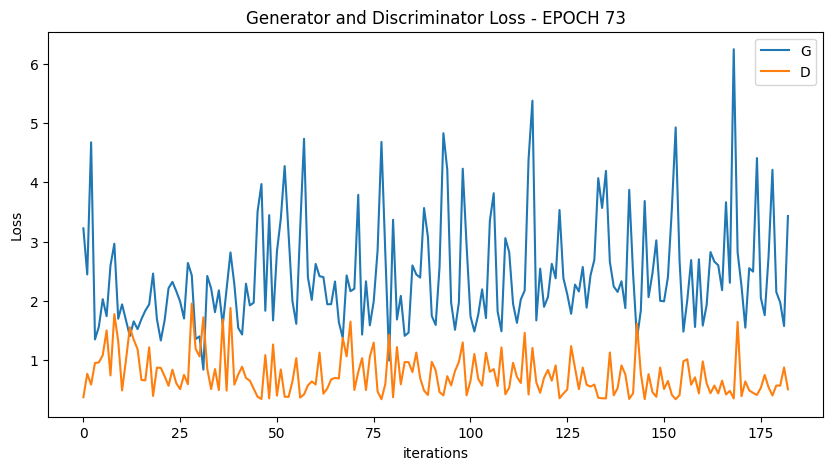

  0%|          | 0/183 [00:00<?, ?it/s]

[75/100][91/183] Loss_D: 0.3399 Loss_G: 3.9842 D(x): 0.8951 D(G(z)): 0.0128 / 0.0127
[75/100][182/183] Loss_D: 0.5213 Loss_G: 2.3637 D(x): 0.9754 D(G(z)): 0.1184 / 0.0812


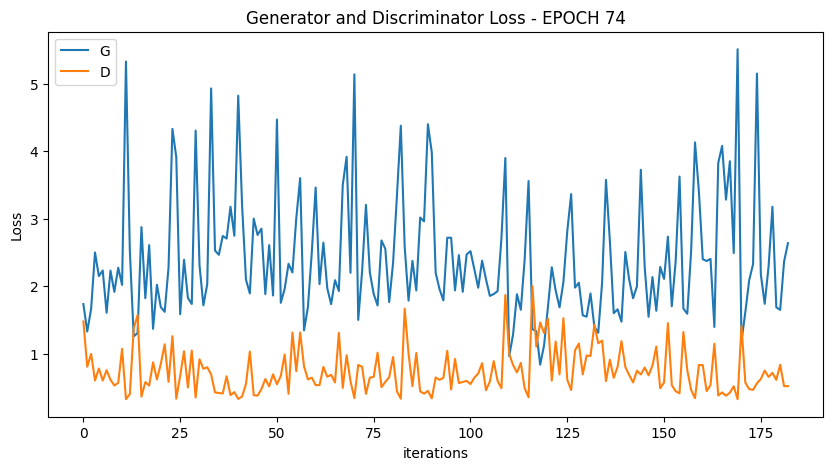

  0%|          | 0/183 [00:00<?, ?it/s]

[76/100][91/183] Loss_D: 1.1906 Loss_G: 1.2415 D(x): 0.7018 D(G(z)): 0.5203 / 0.2603
[76/100][182/183] Loss_D: 0.3637 Loss_G: 3.9872 D(x): 0.8419 D(G(z)): 0.0215 / 0.0189


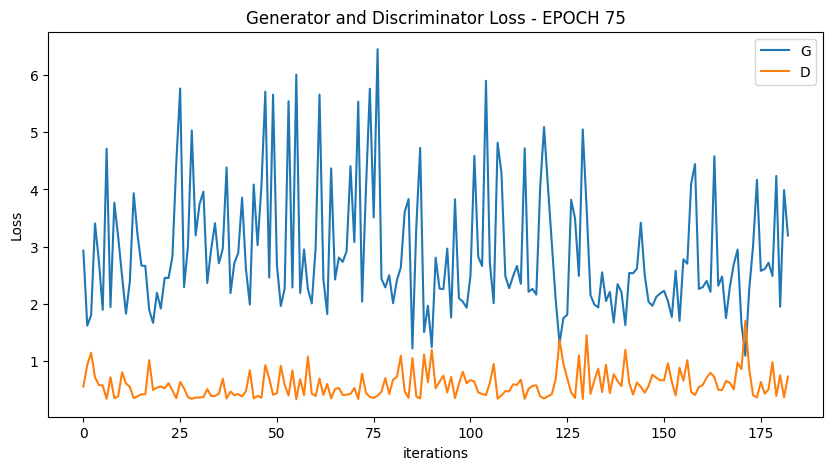

  0%|          | 0/183 [00:00<?, ?it/s]

[77/100][91/183] Loss_D: 0.6753 Loss_G: 3.2491 D(x): 0.5263 D(G(z)): 0.0203 / 0.0343
[77/100][182/183] Loss_D: 0.3627 Loss_G: 3.6887 D(x): 0.8432 D(G(z)): 0.0220 / 0.0185


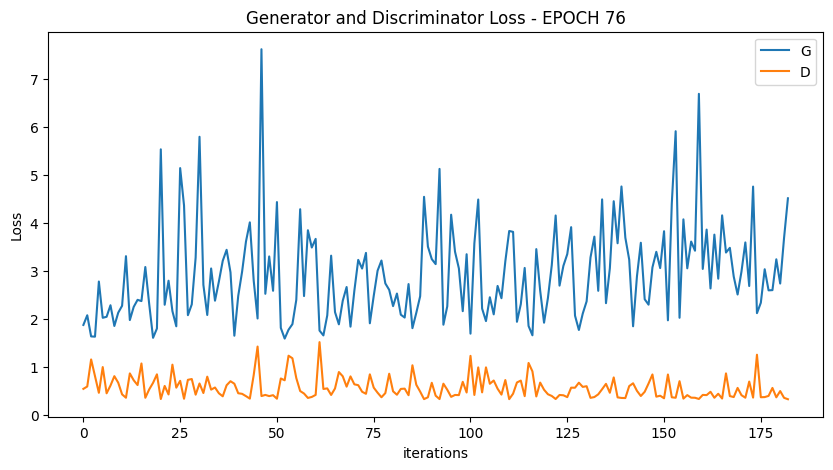

  0%|          | 0/183 [00:00<?, ?it/s]

[78/100][91/183] Loss_D: 1.0729 Loss_G: 3.5122 D(x): 0.9067 D(G(z)): 0.5211 / 0.0202
[78/100][182/183] Loss_D: 0.3319 Loss_G: 5.2749 D(x): 0.9022 D(G(z)): 0.0023 / 0.0029


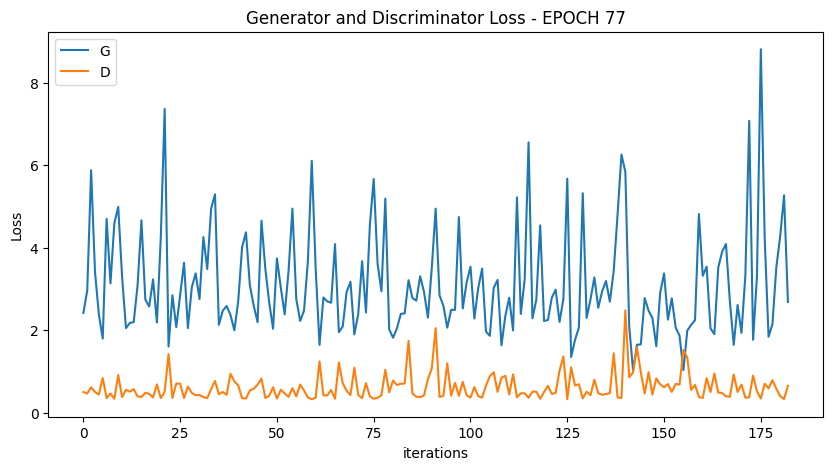

  0%|          | 0/183 [00:00<?, ?it/s]

[79/100][91/183] Loss_D: 0.7251 Loss_G: 2.2284 D(x): 0.9805 D(G(z)): 0.2689 / 0.0885
[79/100][182/183] Loss_D: 0.5404 Loss_G: 2.6519 D(x): 0.9438 D(G(z)): 0.1774 / 0.0533


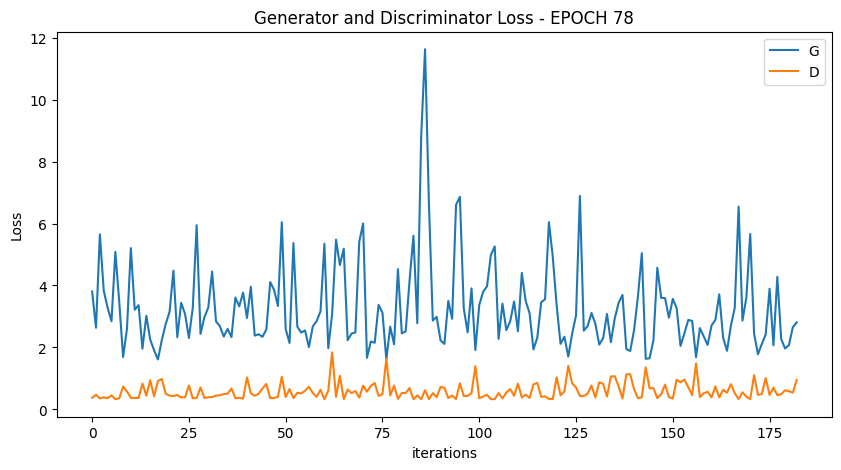

  0%|          | 0/183 [00:00<?, ?it/s]

[80/100][91/183] Loss_D: 1.0801 Loss_G: 2.0066 D(x): 0.4800 D(G(z)): 0.2718 / 0.1272
[80/100][182/183] Loss_D: 1.2951 Loss_G: 1.2744 D(x): 0.7905 D(G(z)): 0.5568 / 0.2619


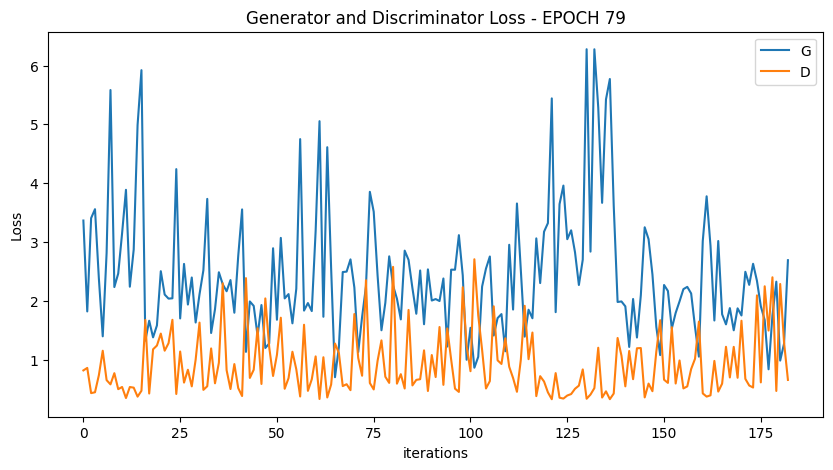

  0%|          | 0/183 [00:00<?, ?it/s]

[81/100][91/183] Loss_D: 0.7858 Loss_G: 1.8679 D(x): 0.5506 D(G(z)): 0.1464 / 0.1398
[81/100][182/183] Loss_D: 0.3651 Loss_G: 2.8112 D(x): 0.8853 D(G(z)): 0.0361 / 0.0443


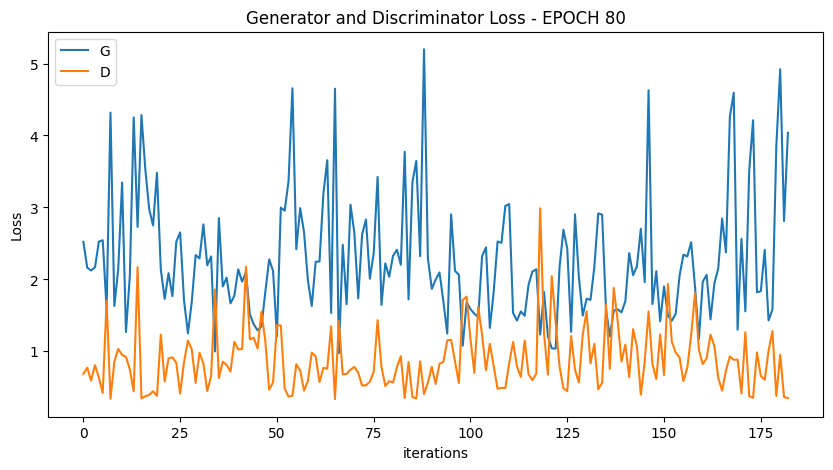

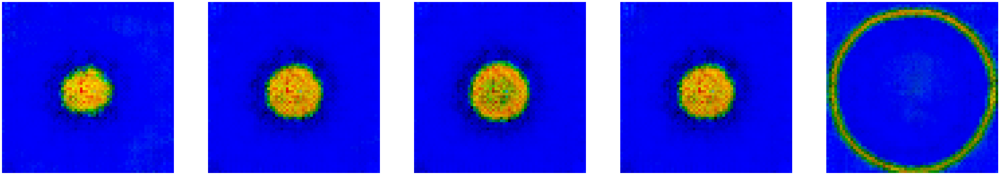

  0%|          | 0/183 [00:00<?, ?it/s]

[82/100][91/183] Loss_D: 1.6916 Loss_G: 1.2894 D(x): 0.2865 D(G(z)): 0.3796 / 0.2463
[82/100][182/183] Loss_D: 1.1461 Loss_G: 2.3001 D(x): 0.3631 D(G(z)): 0.1414 / 0.0819


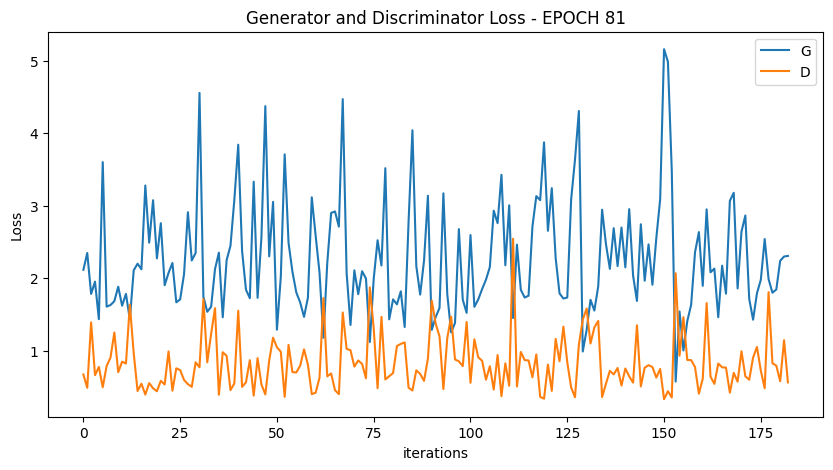

  0%|          | 0/183 [00:00<?, ?it/s]

[83/100][91/183] Loss_D: 0.4074 Loss_G: 2.1407 D(x): 0.8989 D(G(z)): 0.0783 / 0.1017
[83/100][182/183] Loss_D: 0.6555 Loss_G: 3.2740 D(x): 0.6072 D(G(z)): 0.0358 / 0.0274


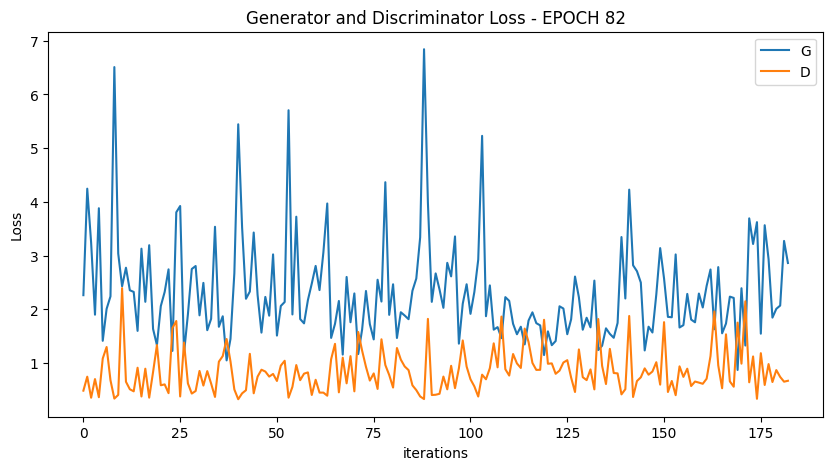

  0%|          | 0/183 [00:00<?, ?it/s]

[84/100][91/183] Loss_D: 0.7390 Loss_G: 1.7936 D(x): 0.8074 D(G(z)): 0.2873 / 0.1693
[84/100][182/183] Loss_D: 1.2810 Loss_G: 1.4254 D(x): 0.6566 D(G(z)): 0.5260 / 0.2289


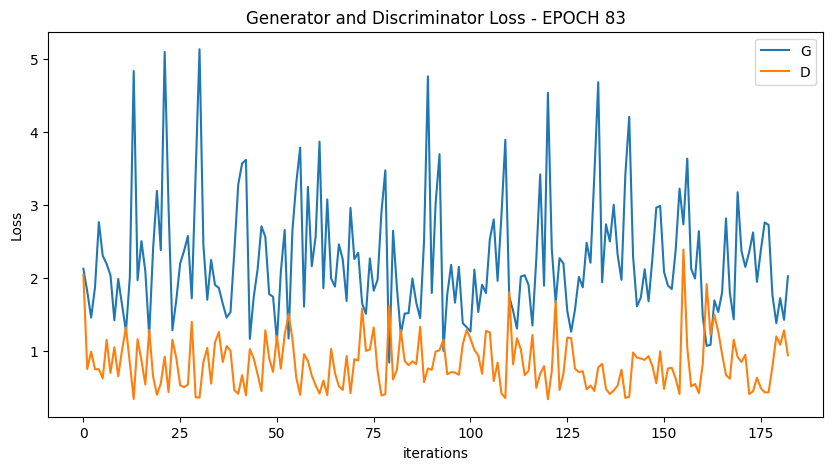

  0%|          | 0/183 [00:00<?, ?it/s]

[85/100][91/183] Loss_D: 0.9871 Loss_G: 1.5565 D(x): 0.8201 D(G(z)): 0.4058 / 0.2227
[85/100][182/183] Loss_D: 0.7405 Loss_G: 1.9068 D(x): 0.8968 D(G(z)): 0.3167 / 0.1473


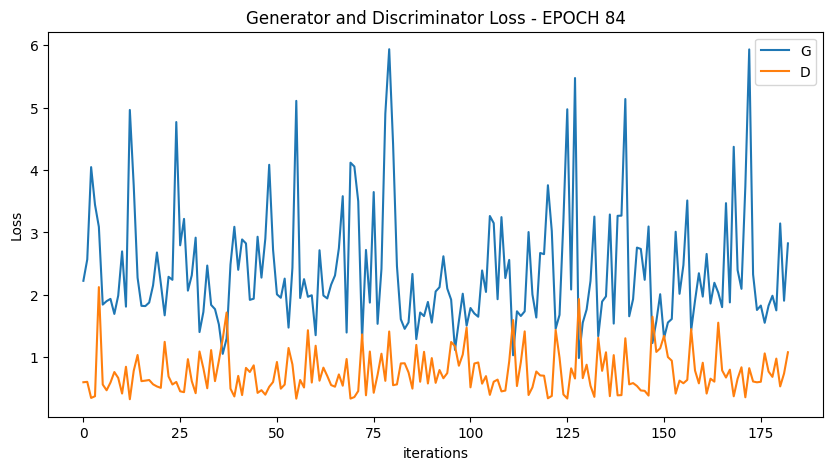

  0%|          | 0/183 [00:00<?, ?it/s]

[86/100][91/183] Loss_D: 0.5837 Loss_G: 2.4825 D(x): 0.9168 D(G(z)): 0.2133 / 0.0846
[86/100][182/183] Loss_D: 0.8967 Loss_G: 1.8047 D(x): 0.9511 D(G(z)): 0.4126 / 0.1375


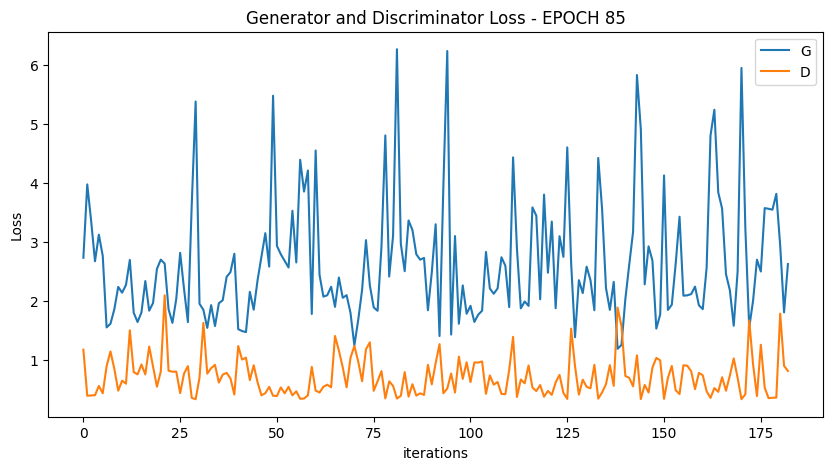

  0%|          | 0/183 [00:00<?, ?it/s]

[87/100][91/183] Loss_D: 0.5032 Loss_G: 5.4364 D(x): 0.6435 D(G(z)): 0.0034 / 0.0031
[87/100][182/183] Loss_D: 0.5582 Loss_G: 2.3045 D(x): 0.6597 D(G(z)): 0.0710 / 0.0801


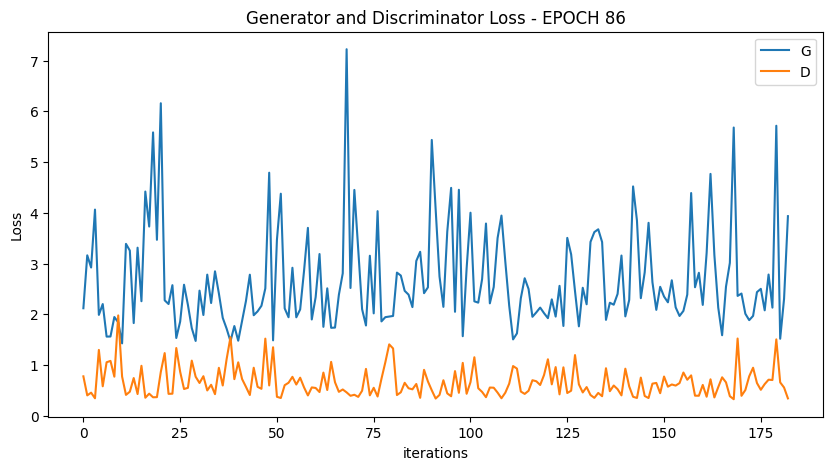

  0%|          | 0/183 [00:00<?, ?it/s]

[88/100][91/183] Loss_D: 0.6497 Loss_G: 2.3109 D(x): 0.6673 D(G(z)): 0.1342 / 0.0781
[88/100][182/183] Loss_D: 0.6669 Loss_G: 2.2610 D(x): 0.9374 D(G(z)): 0.2745 / 0.0863


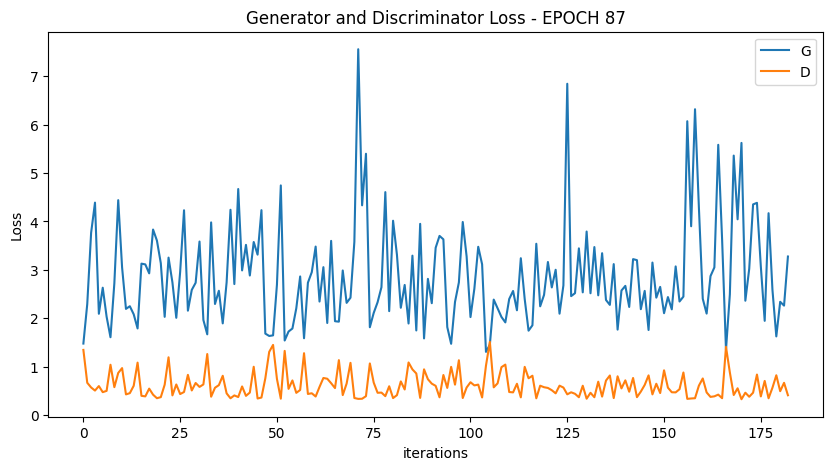

  0%|          | 0/183 [00:00<?, ?it/s]

[89/100][91/183] Loss_D: 0.8972 Loss_G: 1.4555 D(x): 0.5138 D(G(z)): 0.1563 / 0.2040
[89/100][182/183] Loss_D: 0.6608 Loss_G: 2.9337 D(x): 0.8374 D(G(z)): 0.2500 / 0.0412


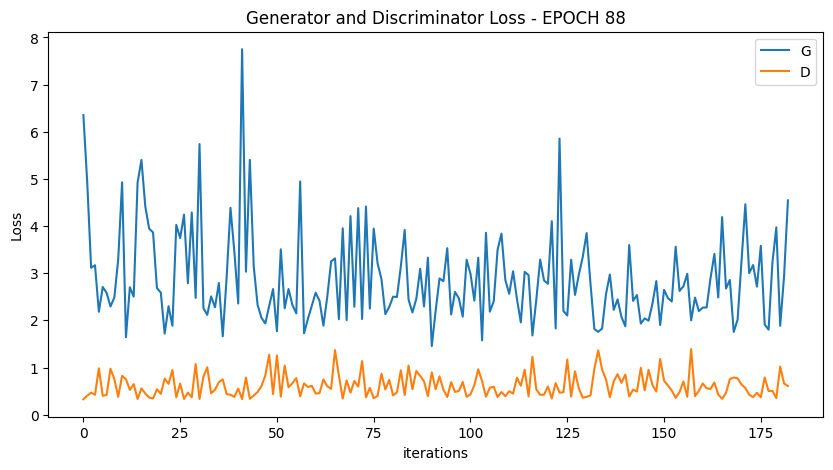

  0%|          | 0/183 [00:00<?, ?it/s]

[90/100][91/183] Loss_D: 0.4750 Loss_G: 3.1551 D(x): 0.7232 D(G(z)): 0.0371 / 0.0311
[90/100][182/183] Loss_D: 0.7087 Loss_G: 3.6501 D(x): 0.6029 D(G(z)): 0.0088 / 0.0192


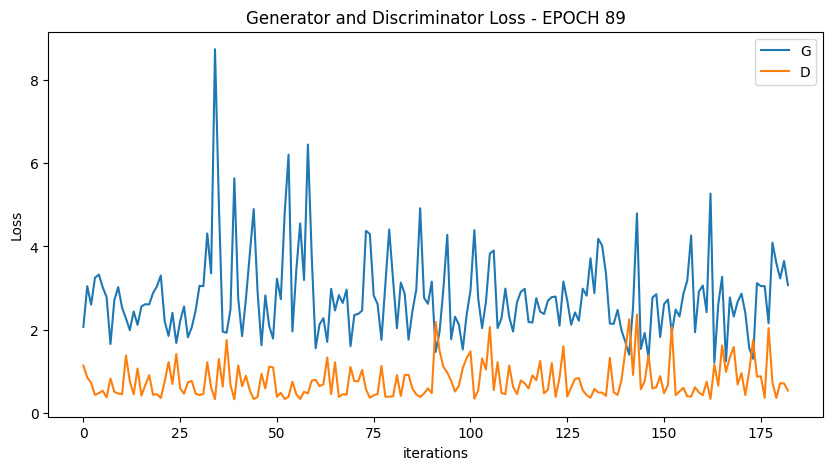

  0%|          | 0/183 [00:00<?, ?it/s]

[91/100][91/183] Loss_D: 0.7153 Loss_G: 1.6801 D(x): 0.9283 D(G(z)): 0.2954 / 0.1589
[91/100][182/183] Loss_D: 1.6023 Loss_G: 2.4712 D(x): 0.7846 D(G(z)): 0.7034 / 0.0648


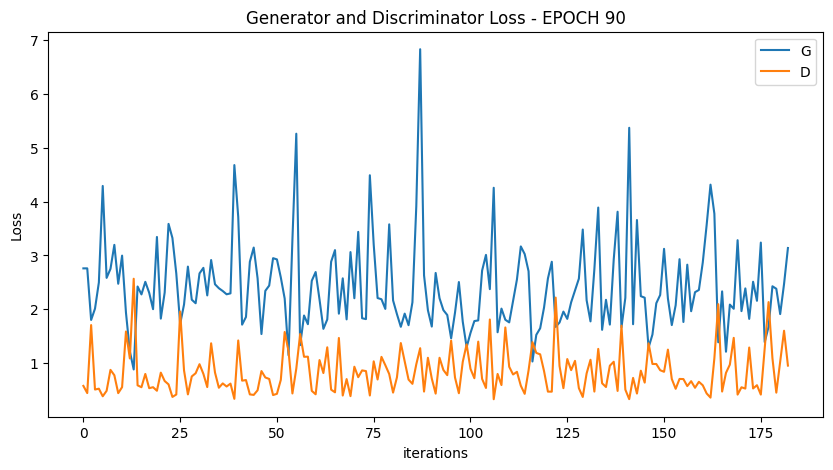

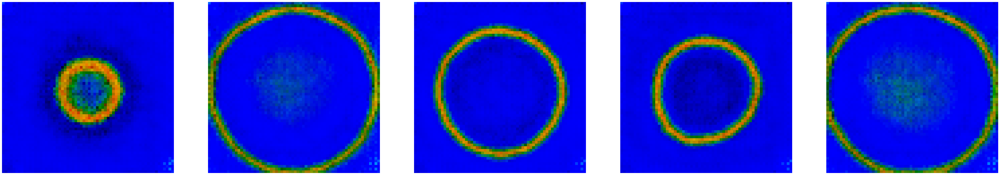

  0%|          | 0/183 [00:00<?, ?it/s]

[92/100][91/183] Loss_D: 1.0462 Loss_G: 1.7993 D(x): 0.9193 D(G(z)): 0.4313 / 0.1442
[92/100][182/183] Loss_D: 0.5119 Loss_G: 2.5253 D(x): 0.9017 D(G(z)): 0.1664 / 0.0670


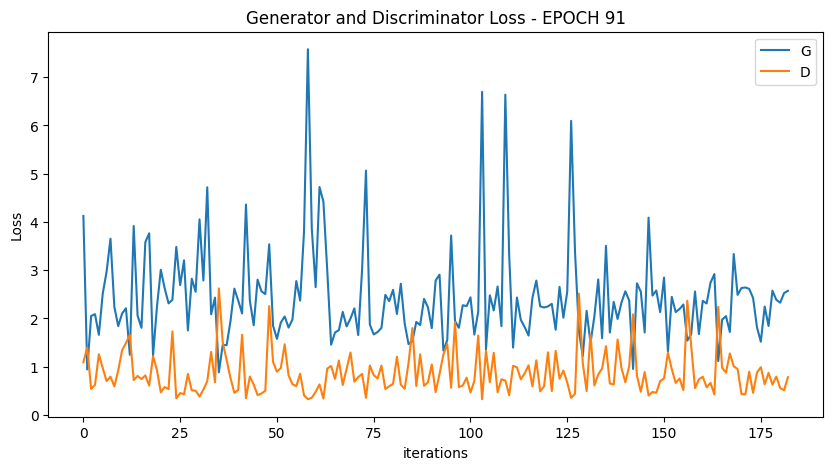

  0%|          | 0/183 [00:00<?, ?it/s]

[93/100][91/183] Loss_D: 0.4299 Loss_G: 2.3073 D(x): 0.9187 D(G(z)): 0.0918 / 0.0786
[93/100][182/183] Loss_D: 0.5149 Loss_G: 2.7368 D(x): 0.8589 D(G(z)): 0.1566 / 0.0481


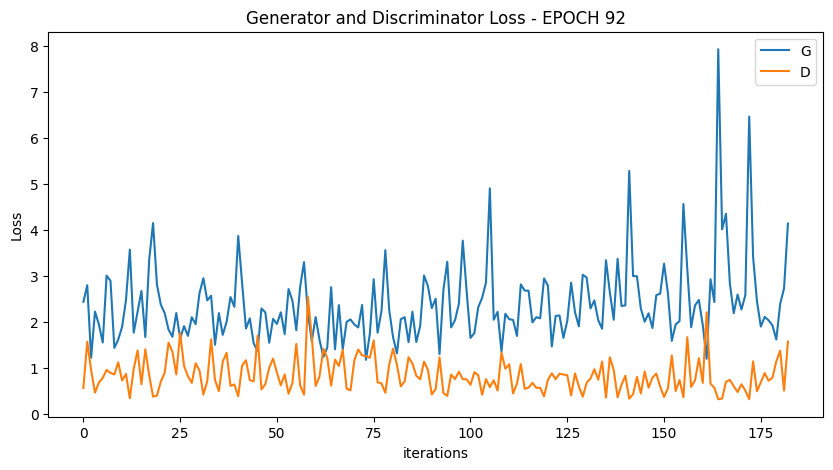

  0%|          | 0/183 [00:00<?, ?it/s]

[94/100][91/183] Loss_D: 1.3648 Loss_G: 1.4798 D(x): 0.5447 D(G(z)): 0.4703 / 0.1987
[94/100][182/183] Loss_D: 0.4263 Loss_G: 2.2778 D(x): 0.9069 D(G(z)): 0.0948 / 0.0809


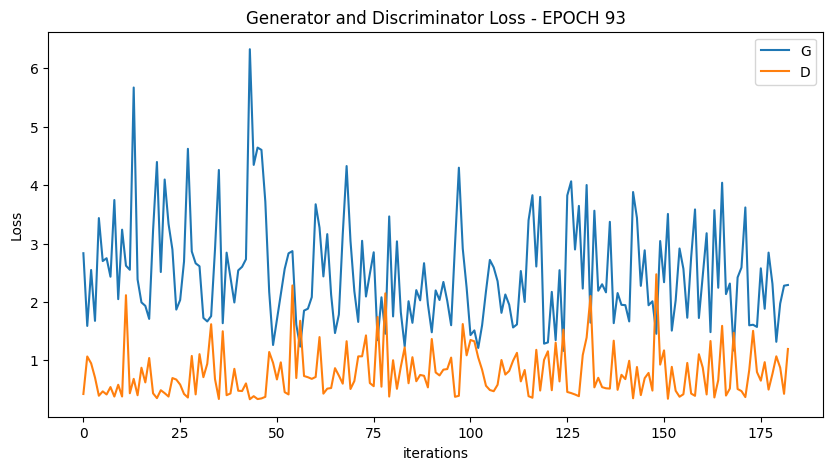

  0%|          | 0/183 [00:00<?, ?it/s]

[95/100][91/183] Loss_D: 0.5111 Loss_G: 2.1894 D(x): 0.8950 D(G(z)): 0.1647 / 0.0926
[95/100][182/183] Loss_D: 0.3719 Loss_G: 3.5071 D(x): 0.8964 D(G(z)): 0.0447 / 0.0287


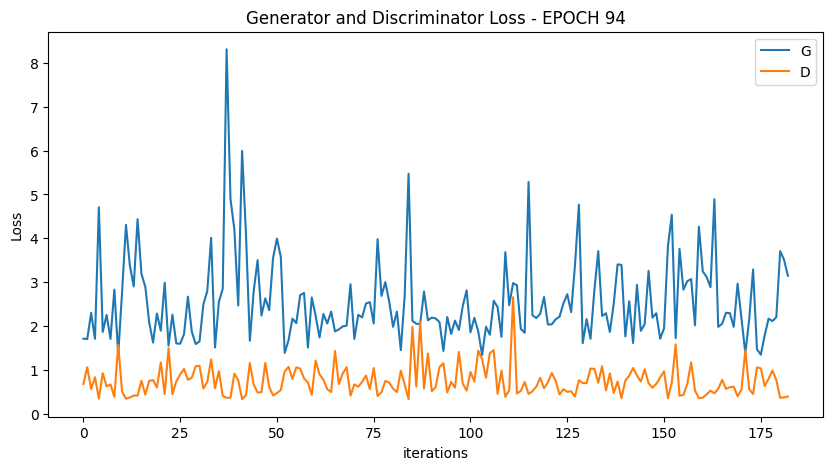

  0%|          | 0/183 [00:00<?, ?it/s]

[96/100][91/183] Loss_D: 1.1572 Loss_G: 2.1838 D(x): 0.3129 D(G(z)): 0.0696 / 0.1108
[96/100][182/183] Loss_D: 0.4649 Loss_G: 2.2452 D(x): 0.7972 D(G(z)): 0.0902 / 0.0838


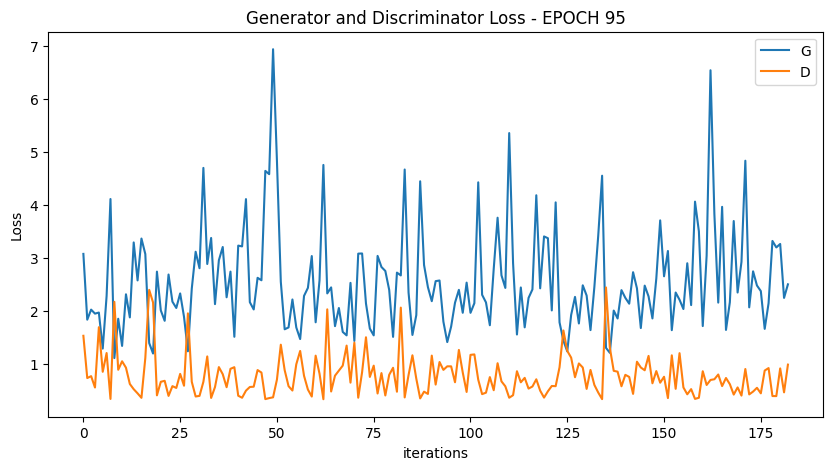

  0%|          | 0/183 [00:00<?, ?it/s]

[97/100][91/183] Loss_D: 0.7080 Loss_G: 2.0022 D(x): 0.5904 D(G(z)): 0.1337 / 0.1136
[97/100][182/183] Loss_D: 1.1173 Loss_G: 1.8913 D(x): 0.4628 D(G(z)): 0.1850 / 0.1438


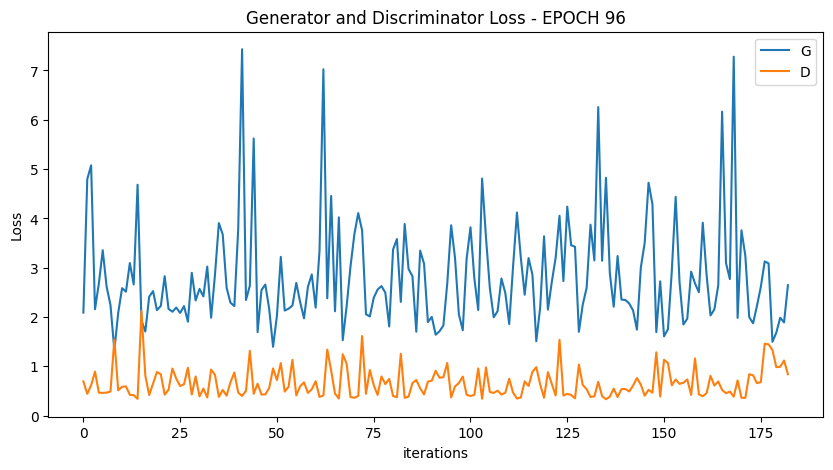

  0%|          | 0/183 [00:00<?, ?it/s]

[98/100][91/183] Loss_D: 0.4646 Loss_G: 2.7194 D(x): 0.9012 D(G(z)): 0.1291 / 0.0521
[98/100][182/183] Loss_D: 0.4435 Loss_G: 3.1526 D(x): 0.9418 D(G(z)): 0.0875 / 0.0375


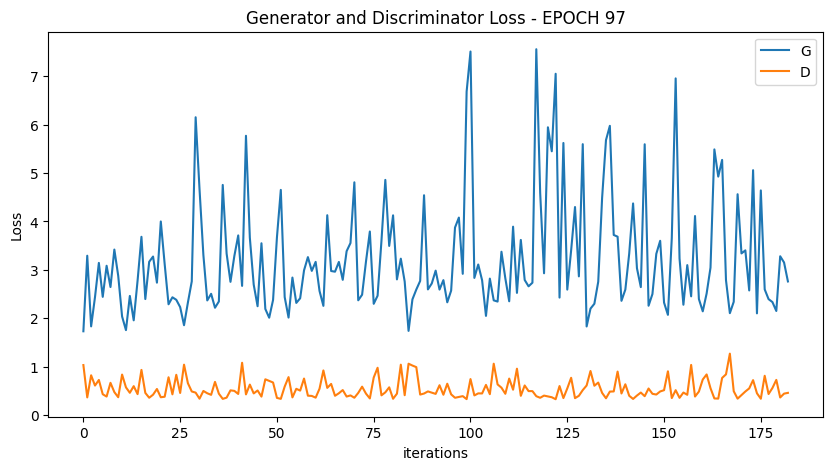

  0%|          | 0/183 [00:00<?, ?it/s]

[99/100][91/183] Loss_D: 0.5090 Loss_G: 2.4578 D(x): 0.7021 D(G(z)): 0.0586 / 0.0660
[99/100][182/183] Loss_D: 0.3378 Loss_G: 4.2249 D(x): 0.9248 D(G(z)): 0.0086 / 0.0093


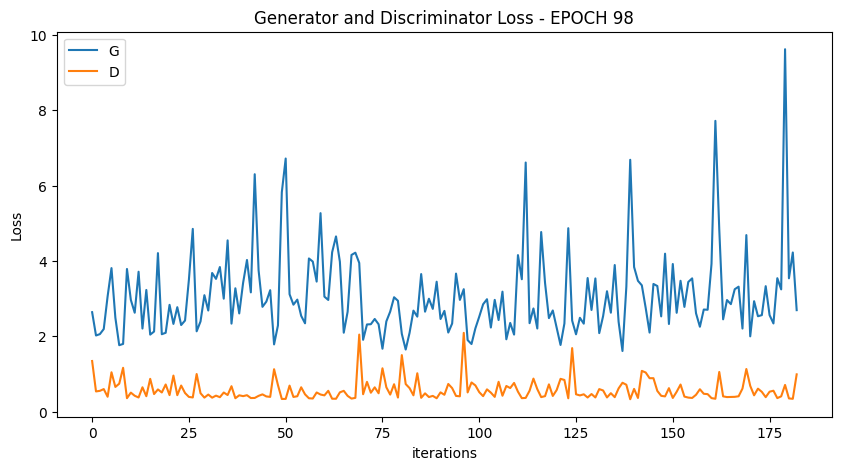

  0%|          | 0/183 [00:00<?, ?it/s]

[100/100][91/183] Loss_D: 1.3279 Loss_G: 2.2556 D(x): 0.4892 D(G(z)): 0.4571 / 0.0835
[100/100][182/183] Loss_D: 0.7296 Loss_G: 2.4672 D(x): 0.5825 D(G(z)): 0.0498 / 0.0703


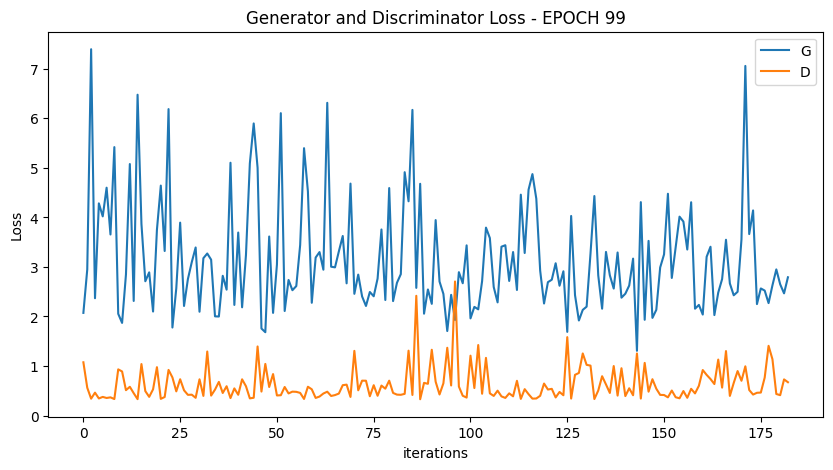

In [16]:
avg_G_losses = []
avg_D_losses = []
for epoch in range(epochs):
    G_losses = []
    D_losses = []
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # train with real
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)
        
        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()
        
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss(G_losses, D_losses, epoch)
    avg_G_losses.append(sum(G_losses) / len(G_losses))
    avg_D_losses.append(sum(D_losses) / len(D_losses))
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)
    
#             valid_image = netG(fixed_noise)


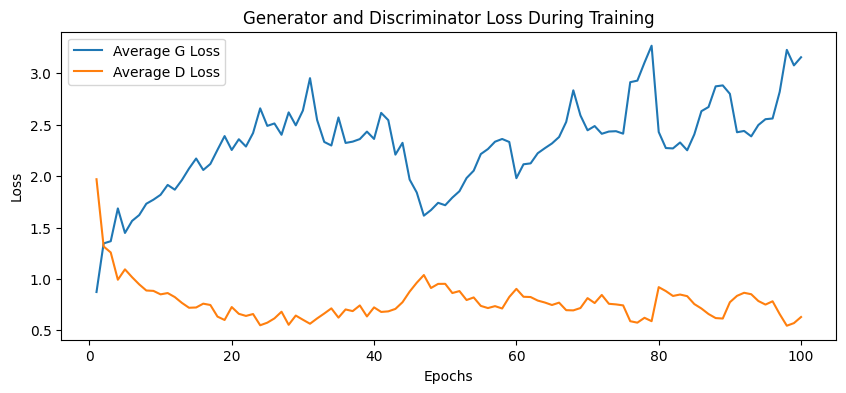

In [22]:
plot_final_loss(avg_G_losses, avg_D_losses)

In [18]:
print (">> average EPOCH duration = ", np.mean(epoch_time))

>> average EPOCH duration =  4.104840369224548


In [ ]:
torch.save(netG.state_dict(), 'Generator.pth')
torch.save(netD.state_dict(), 'Discriminator.pth')

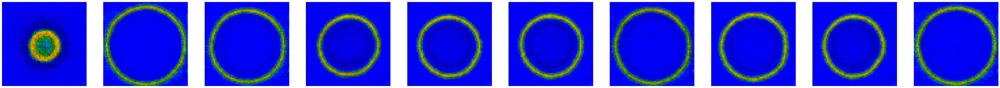

In [19]:
show_generated_img(10)

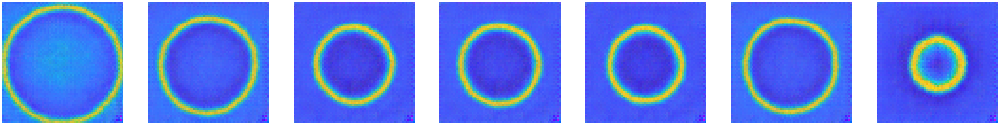

In [20]:
show_generated_img_unnormalized(7)

In [23]:
if not os.path.exists('/kaggle/working/output_images'):
    os.mkdir('/kaggle/working/output_images')
    
im_batch_size = 5
n_images=300

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images * 0.5 + 0.5  # Unnormalize the images
    #images = torch.clamp(images, 0, 1)  # Ensure values are within [0, 1]

    for i_image in range(gen_images.size(0)):
        save_image(images[i_image, :, :, :], os.path.join('/kaggle/working/output_images', f'image_{i_batch+i_image:05d}.png'))

/tmp/ipykernel_120/944965058.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i_batch in tqdm(range(0, n_images, im_batch_size)):


  0%|          | 0/60 [00:00<?, ?it/s]

There are 365 Images .


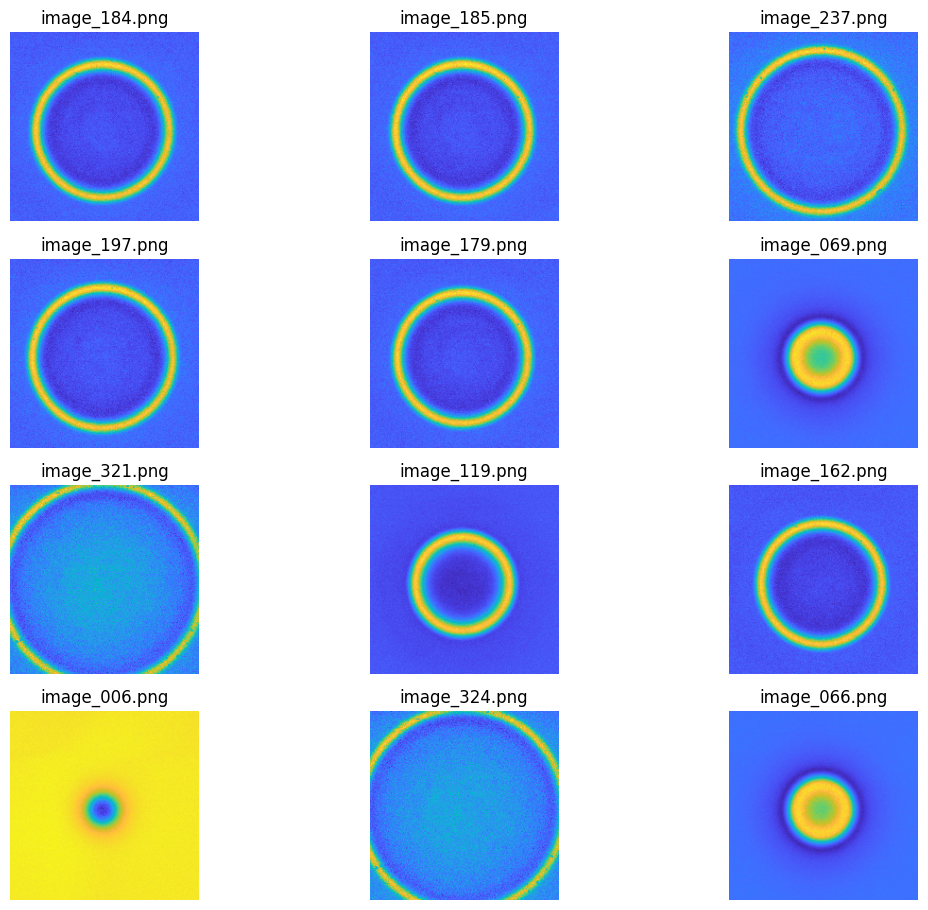

In [24]:
PATH = '/kaggle/input/healthy/Healthy/'
images = os.listdir(PATH)
print(f'There are {len(os.listdir(PATH))} Images .')

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH)))
    # https://matplotlib.org/users/image_tutorial.html
    img = plt.imread(PATH + images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

In [25]:
PATH = '/kaggle/working/output_images/'
images = os.listdir(PATH)
print(f'There are {len(os.listdir(PATH))} Images .')

fig, axes = plt.subplots(nrows=20, ncols=3, figsize=(120,100))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH)))
    # https://matplotlib.org/users/image_tutorial.html
    img = plt.imread(PATH + images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

There are 300 Images .


In [26]:
import os
import cv2

def sharpening_multiple_images(input_folder, output_folder):
    # Ensure the output folder exists
    os.makedirs(output_folder, exist_ok=True)

    # Get a list of all image files in the input folder
    image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif'))]

    # Process each image
    for image_file in image_files:
        # Construct the full path of the input image
        image_path = os.path.join(input_folder, image_file)

        # Read the image
        image = cv2.imread(image_path)
        
        # Apply sharpening
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
        laplacian_uint8 = np.uint8(np.absolute(laplacian))
        laplacian_uint8 = cv2.cvtColor(laplacian_uint8, cv2.COLOR_GRAY2BGR)
        sharpened = cv2.addWeighted(image, 1, laplacian_uint8, 0.5, -10)

        # Construct the full path of the output image
        output_path = os.path.join(output_folder, f'sharped_{image_file}')
        
        # Write the sharpened image
        cv2.imwrite(output_path, sharpened)


In [27]:
sharpening_multiple_images('/kaggle/working/output_images','/kaggle/working/final_365')

In [29]:
PATH = '/kaggle/working/final_365/'
images = os.listdir(PATH)
print(f'There are {len(os.listdir(PATH))} Images .')

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(220,100))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH)))
    # https://matplotlib.org/users/image_tutorial.html
    img = plt.imread(PATH + images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

There are 300 Images .


In [ ]:
!zip -r 365_250_epochs.zip /kaggle/working/final_365/